# Contents

**1) Imports**

**2) Read in and explore data**

**3) Data Analysis**

**4) Data Visualisation**

**5) Data Cleaning**

**6) Feature Engineering**

**7) Model Selection**

**8) Submission**

**9) Notes**

# 1) Imports

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import RobustScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import KFold
from scipy.stats import skew, norm
from sklearn.model_selection import cross_val_score
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from sklearn.ensemble import RandomForestRegressor
from lightgbm import LGBMRegressor
from sklearn.linear_model import LassoCV
from sklearn.linear_model import ElasticNetCV
from sklearn import linear_model
from sklearn.svm import LinearSVR
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import StackingRegressor
from sklearn.preprocessing import PowerTransformer
from sklearn.model_selection import learning_curve
from sklearn.model_selection import validation_curve
from sklearn.preprocessing import PolynomialFeatures
import os
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


# 2) Read in and Explore Data

**Read in train and test data**

In [2]:
train = pd.read_csv('/kaggle/input/home-data-for-ml-course/train.csv',index_col=0)
test = pd.read_csv('/kaggle/input/home-data-for-ml-course/test.csv',index_col=0)

**Combine train and test data in prep for data cleaning**

In [3]:
y = train.SalePrice
train = train.drop('SalePrice',axis = 1)
#test = test.drop('SalePrice',axis = 1)  #No SalePrice in test
train['train_test'] = 1
test['train_test'] = 0
X = pd.concat([train,test])

**Look at first few rows of data**

In [4]:
X.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,train_test
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706.0,Unf,0.0,150.0,856.0,GasA,Ex,Y,SBrkr,856,854,0,1710,1.0,0.0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2.0,548.0,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,1
2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.0,Unf,0.0,284.0,1262.0,GasA,Ex,Y,SBrkr,1262,0,0,1262,0.0,1.0,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2.0,460.0,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,1
3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.0,Unf,0.0,434.0,920.0,GasA,Ex,Y,SBrkr,920,866,0,1786,1.0,0.0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2.0,608.0,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,1
4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216.0,Unf,0.0,540.0,756.0,GasA,Gd,Y,SBrkr,961,756,0,1717,1.0,0.0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3.0,642.0,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,1
5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655.0,Unf,0.0,490.0,1145.0,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1.0,0.0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3.0,836.0,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,1


# 3) Data Analysis

**Have a look at how many values are null and what the features are**

In [5]:
print('TRAIN DATA')
train.info()
print('-' * 100)
print('TEST DATA')
test.info()

TRAIN DATA
<class 'pandas.core.frame.DataFrame'>
Int64Index: 1460 entries, 1 to 1460
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1201 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   Street         1460 non-null   object 
 5   Alley          91 non-null     object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 1

**Have a look at the distribution of the data**

In [6]:
X.describe(include = 'all')

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,train_test
count,2919.000000,2915,2433.000000,2919.000000,2919,198,2919,2919,2917,2919,2919,2919,2919,2919,2919,2919,2919.000000,2919.000000,2919.000000,2919.000000,2919,2919,2918,2918,2895,2896.000000,2919,2919,2919,2838,2837,2837,2840,2918.000000,2839,2918.000000,2918.000000,2918.000000,2919,2919,2919,2918,2919.000000,2919.000000,2919.000000,2919.000000,2917.000000,2917.000000,2919.000000,2919.000000,2919.000000,2919.000000,2918,2919.000000,2917,2919.000000,1499,2762,2760.000000,2760,2918.000000,2918.000000,2760,2760,2919,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,10,571,105,2919.000000,2919.000000,2919.000000,2918,2919,2919.000000
unique,NaN,5,NaN,NaN,2,2,4,4,2,5,3,25,9,8,5,8,NaN,NaN,NaN,NaN,6,8,15,16,4,NaN,4,5,6,4,4,4,6,NaN,6,NaN,NaN,NaN,6,5,2,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,NaN,7,NaN,5,6,NaN,3,NaN,NaN,5,5,3,NaN,NaN,NaN,NaN,NaN,NaN,3,4,4,NaN,NaN,NaN,9,6,NaN
top,NaN,RL,NaN,NaN,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,NaN,NaN,NaN,NaN,Gable,CompShg,VinylSd,VinylSd,None,NaN,TA,TA,PConc,TA,TA,No,Unf,NaN,Unf,NaN,NaN,NaN,GasA,Ex,Y,SBrkr,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,TA,NaN,Typ,NaN,Gd,Attchd,NaN,Unf,NaN,NaN,TA,TA,Y,NaN,NaN,NaN,NaN,NaN,NaN,Ex,MnPrv,Shed,NaN,NaN,NaN,WD,Normal,NaN
freq,NaN,2265,NaN,NaN,2907,120,1859,2622,2916,2133,2778,443,2511,2889,2425,1471,NaN,NaN,NaN,NaN,2310,2876,1025,1014,1742,NaN,1798,2538,1308,1283,2606,1904,851,NaN,2493,NaN,NaN,NaN,2874,1493,2723,2671,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1492,NaN,2717,NaN,744,1723,NaN,1230,NaN,NaN,2604,2654,2641,NaN,NaN,NaN,NaN,NaN,NaN,4,329,95,NaN,NaN,NaN,2525,2402,NaN
mean,57.137718,NaN,69.305795,10168.114080,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.089072,5.564577,1971.312778,1984.264474,NaN,NaN,NaN,NaN,NaN,102.201312,NaN,NaN,NaN,NaN,NaN,NaN,NaN,441.423235,NaN,49.582248,560.772104,1051.777587,NaN,NaN,NaN,NaN,1159.581706,336.483727,4.694416,1500.759849,0.429894,0.061364,1.568003,0.380267,2.860226,1.044536,NaN,6.451524,NaN,0.597122,NaN,NaN,1978.113406,NaN,1.766621,472.874572,NaN,NaN,NaN,93.709832,47.486811,23.098321,2.602261,16.062350,2.251799,NaN,NaN,NaN,50.825968,6.213087,2007.792737,NaN,NaN,0.500171
std,42.517628,NaN,23.344905,7886.996359,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.409947,1.113131,30.291442,20.894344,NaN,NaN,NaN,NaN,NaN,179.334253,NaN,NaN,NaN,NaN,NaN,NaN,NaN,455.610826,NaN,169.205611,439.543659,440.766258,NaN,NaN,NaN,NaN,392.362079,428.701456,46.396825,506.051045,0.524736,0.245687,0.552969,0.502872,0.822693,0.214462,NaN,1.569379,NaN,0.646129,NaN,NaN,25.574285,NaN,0.761624,215.394815,NaN,NaN,NaN,126.526589,67.575493,64.244246,25.188169,56.184365,35.663946,NaN,NaN,NaN,567.402211,2.714762,1.314964,NaN,NaN,0.500086
min,20.000000,NaN,21.000000,1300.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,1.000000,1872.000000,1950.000000,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,2.000000,NaN,0.000000,NaN,NaN,1895.000000,NaN,0.000000,0.000000,NaN,NaN,NaN,0.000000,0.000000

**Can see a large number of na values. Also a noticeable outlier of 2207 in the GarageYrBlt, clearly a typo which I will fix. Alley, MiscFeature, FireplaceQu, Fence and PoolQC are features with over half of rows with a value of na.**

In [7]:
categorical_cols = train.select_dtypes(include=['object']).columns.tolist()
print(categorical_cols)
print('No of cols: ' + str(len(categorical_cols)))

['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition']
No of cols: 43


In [8]:
numerical_cols = train.select_dtypes(exclude=['object']).columns.tolist()
print(numerical_cols)
print('No of cols: ' + str(len(numerical_cols)))

['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'train_test']
No of cols: 37


**Split features further: continuous, discrete, ordinal, nominal, alphanumerical and binary**

**Continuous features: 'LotFrontage', 'LotArea', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF','GrLivArea', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal'**

**Discrete features: 'MSSubClass', 'YearBuilt', 'YearRemodAdd', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'MoSold', 'YrSold', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr'**

**Ordinal features: 'OverallQual', 'OverallCond', 'LotShape', 'ExterQual', 'ExterCond', 'BsmtQual','BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'HeatingQC', 'KitchenQual', 'FireplaceQu', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive'(Ordinal or nominal?), 'PoolQC', 'Fence'(Ordinal or nominal?)**

**Nominal features: 'MSZoning', 'Street', 'Alley', 'LandContour', 'Utilities', 'LandSlope', 'Neighborhood', 'Condition1','Condition2', 'RoofStyle', 'RoofMatl', 'Exterior1st','Exterior2nd', 'MasVnrType', 'Foundation', 'Heating', 'Electrical', 'Functional', 'GarageType', 'MiscFeature', 'SaleType','SaleCondition', 'MSSubClass'**

**Alphanumerical features: 'LotConfig','BldgType','HouseStyle'**

**Binary features: CentralAir**

**Temp features: train_test**

**N.B. MSSubClass appears to be a discrete features but is infact a nominal one**

In [9]:
train['MSSubClass'] = train['MSSubClass'].astype('str')
test['MSSubClass'] = test['MSSubClass'].astype('str')
X['MSSubClass'] = X['MSSubClass'].astype('str')
numerical_cols.remove('MSSubClass')
categorical_cols.append('MSSubClass')

In [10]:
cont_features = ['LotFrontage', 'LotArea', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF','GrLivArea', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal'] 
disc_features = ['YearBuilt', 'YearRemodAdd', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'MoSold', 'YrSold', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr']
ord_features = ['OverallQual', 'OverallCond', 'LotShape', 'ExterQual', 'ExterCond', 'BsmtQual','BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'HeatingQC', 'KitchenQual', 'FireplaceQu', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence']
nom_features = ['MSSubClass','MSZoning', 'Street', 'Alley', 'LandContour', 'Utilities', 'LandSlope', 'Neighborhood', 'Condition1','Condition2', 'RoofStyle', 'RoofMatl', 'Exterior1st','Exterior2nd', 'MasVnrType', 'Foundation', 'Heating', 'Electrical', 'Functional', 'GarageType', 'MiscFeature', 'SaleType','SaleCondition']
alpnum_features = ['LotConfig','BldgType','HouseStyle']
bin_features = ['CentralAir']
temp_features = ['train_test']
print(len(cont_features) + len(disc_features) + len(ord_features) + len(nom_features) + len(alpnum_features) + len(bin_features) + len(temp_features))

80


In [11]:
print(train[cont_features].head())

    LotFrontage  LotArea  MasVnrArea  BsmtFinSF1  BsmtFinSF2  BsmtUnfSF  \
Id                                                                        
1          65.0     8450       196.0         706           0        150   
2          80.0     9600         0.0         978           0        284   
3          68.0    11250       162.0         486           0        434   
4          60.0     9550         0.0         216           0        540   
5          84.0    14260       350.0         655           0        490   

    TotalBsmtSF  1stFlrSF  2ndFlrSF  LowQualFinSF  GrLivArea  GarageArea  \
Id                                                                         
1           856       856       854             0       1710         548   
2          1262      1262         0             0       1262         460   
3           920       920       866             0       1786         608   
4           756       961       756             0       1717         642   
5          1145   

In [12]:
print(train[disc_features].head())

    YearBuilt  YearRemodAdd  TotRmsAbvGrd  Fireplaces  GarageYrBlt  \
Id                                                                   
1        2003          2003             8           0       2003.0   
2        1976          1976             6           1       1976.0   
3        2001          2002             6           1       2001.0   
4        1915          1970             7           1       1998.0   
5        2000          2000             9           1       2000.0   

    GarageCars  MoSold  YrSold  BsmtFullBath  BsmtHalfBath  FullBath  \
Id                                                                     
1            2       2    2008             1             0         2   
2            2       5    2007             0             1         2   
3            2       9    2008             1             0         2   
4            3       2    2006             1             0         1   
5            3      12    2008             1             0         2   

    

In [13]:
print(train[ord_features].head())

    OverallQual  OverallCond LotShape ExterQual ExterCond BsmtQual BsmtCond  \
Id                                                                            
1             7            5      Reg        Gd        TA       Gd       TA   
2             6            8      Reg        TA        TA       Gd       TA   
3             7            5      IR1        Gd        TA       Gd       TA   
4             7            5      IR1        TA        TA       TA       Gd   
5             8            5      IR1        Gd        TA       Gd       TA   

   BsmtExposure BsmtFinType1 BsmtFinType2 HeatingQC KitchenQual FireplaceQu  \
Id                                                                            
1            No          GLQ          Unf        Ex          Gd         NaN   
2            Gd          ALQ          Unf        Ex          TA          TA   
3            Mn          GLQ          Unf        Ex          Gd          TA   
4            No          ALQ          Unf        Gd

In [14]:
print(train[nom_features].head())

   MSSubClass MSZoning Street Alley LandContour Utilities LandSlope  \
Id                                                                    
1          60       RL   Pave   NaN         Lvl    AllPub       Gtl   
2          20       RL   Pave   NaN         Lvl    AllPub       Gtl   
3          60       RL   Pave   NaN         Lvl    AllPub       Gtl   
4          70       RL   Pave   NaN         Lvl    AllPub       Gtl   
5          60       RL   Pave   NaN         Lvl    AllPub       Gtl   

   Neighborhood Condition1 Condition2 RoofStyle RoofMatl Exterior1st  \
Id                                                                     
1       CollgCr       Norm       Norm     Gable  CompShg     VinylSd   
2       Veenker      Feedr       Norm     Gable  CompShg     MetalSd   
3       CollgCr       Norm       Norm     Gable  CompShg     VinylSd   
4       Crawfor       Norm       Norm     Gable  CompShg     Wd Sdng   
5       NoRidge       Norm       Norm     Gable  CompShg     VinylSd  

In [15]:
print(train[alpnum_features].head())

   LotConfig BldgType HouseStyle
Id                              
1     Inside     1Fam     2Story
2        FR2     1Fam     1Story
3     Inside     1Fam     2Story
4     Corner     1Fam     2Story
5        FR2     1Fam     2Story


In [16]:
print(train[bin_features].head())

   CentralAir
Id           
1           Y
2           Y
3           Y
4           Y
5           Y


In [17]:
print(train[temp_features].head())

    train_test
Id            
1            1
2            1
3            1
4            1
5            1


**Checking I haven't missed any features out or duplicated**

In [18]:
columns = categorical_cols + numerical_cols
features = temp_features + bin_features + alpnum_features + cont_features + disc_features + nom_features + ord_features
print(len(columns))
print(len(features))
print(set(columns)==set(features))

80
80
True


# 4) Data Visualisation

In [19]:
#Add a shortcut boolean to show graphs or not to speed up running the whole notebook:
show = True

**4.1) Target Feature**

<Axes: xlabel='SalePrice', ylabel='Count'>

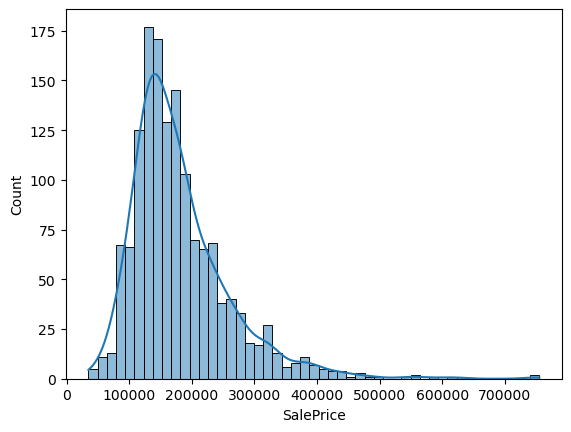

In [20]:
sns.histplot(y,kde = True)

**Slight skew in SalePrice to the right, might be worth log(1+x) transforming the target**

**Look at correlation between target and features**

In [21]:
correlation = pd.concat([train[numerical_cols],y],axis = 1).corr()
correlation[['SalePrice']].sort_values(['SalePrice'], ascending=False)

,SalePrice
SalePrice,1.000000
OverallQual,0.790982
GrLivArea,0.708624
GarageCars,0.640409
GarageArea,0.623431
TotalBsmtSF,0.613581
1stFlrSF,0.605852
FullBath,0.560664
TotRmsAbvGrd,0.533723
YearBuilt,0.522897


**4.2) Numerical Features**

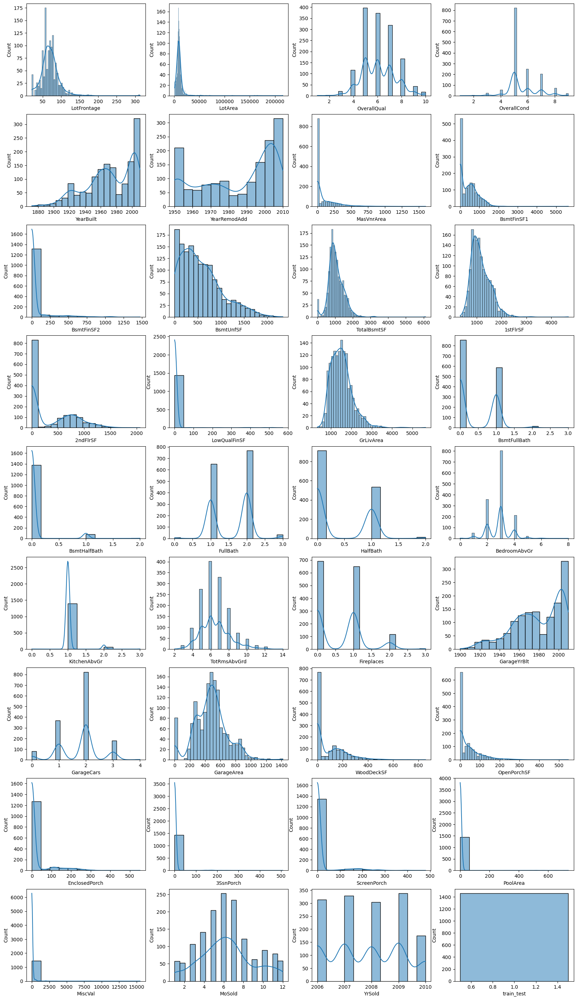

In [22]:
def plot_num_hist(show):
    if(show==True):
        fig = plt.figure(figsize = (20,40))
        ax = []
        for i,val in enumerate(numerical_cols):
            ax.append(fig.add_subplot(10,4,i+1))
            ax.append(sns.histplot(train[val].dropna(),kde = True))
        plt.show()
        fig.tight_layout()
plot_num_hist(show)

**Mostly 0 area for some features e.g. Porch and Pools.**

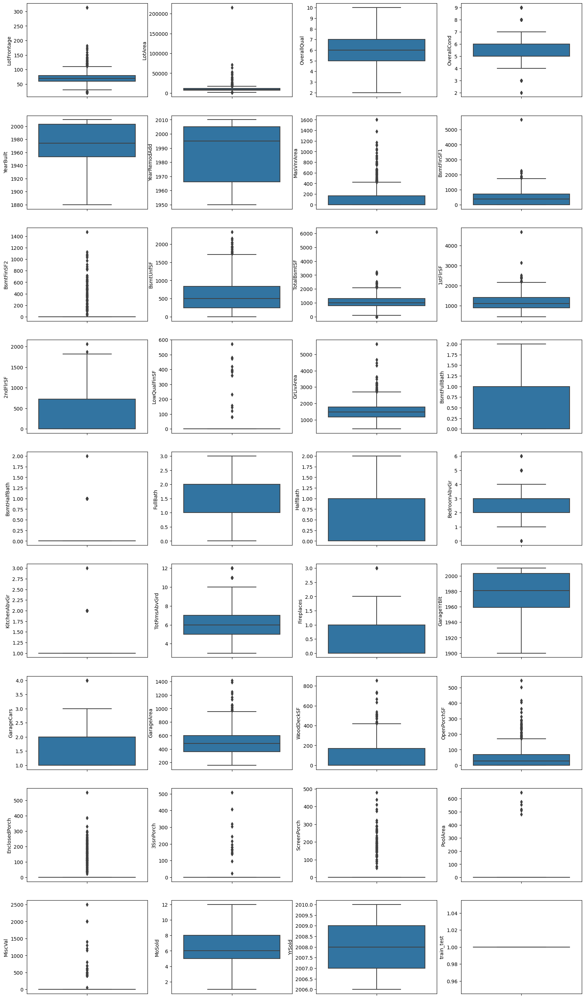

In [23]:
def plot_num_box(show):
    if(show==True):
        fig = plt.figure(figsize = (20,40))
        ax = []
        for i,val in enumerate(numerical_cols):
            ax.append(fig.add_subplot(10,4,i+1))
            ax.append(sns.boxplot(y=val, data = train[numerical_cols].dropna()))
        plt.show()
        fig.tight_layout()
plot_num_box(show)

**Most extreme outliers are: 'LotFrontage','LotArea','BsmtFinSF1', 'TotalBsmtSF', 'GrLivArea'** 

**Less extreme outliers are: 'MasVnrArea', '1stFlrSF', 'Fireplaces', 'GarageCars', 'OpenPorchSF'**

**Mostly 0s: BsmtFinSF2, LowQualFinSF, 'BsmtHalfBalf','KitchenAbvGr', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal'**

**Look for quasi-constant features (features with >95% of the same values here)**

In [24]:
overfit_num = []
for i in numerical_cols:
    counts = train[i].value_counts()
    zeros = counts.iloc[0]
    if zeros / len(train) * 100 > 95:
        overfit_num.append(i)

overfit_num = list(overfit_num)
print(overfit_num)
#X = X.drop(overfit_num, axis=1)

['LowQualFinSF', 'KitchenAbvGr', '3SsnPorch', 'PoolArea', 'MiscVal', 'train_test']


**Look for multicollinearity of over 80%**

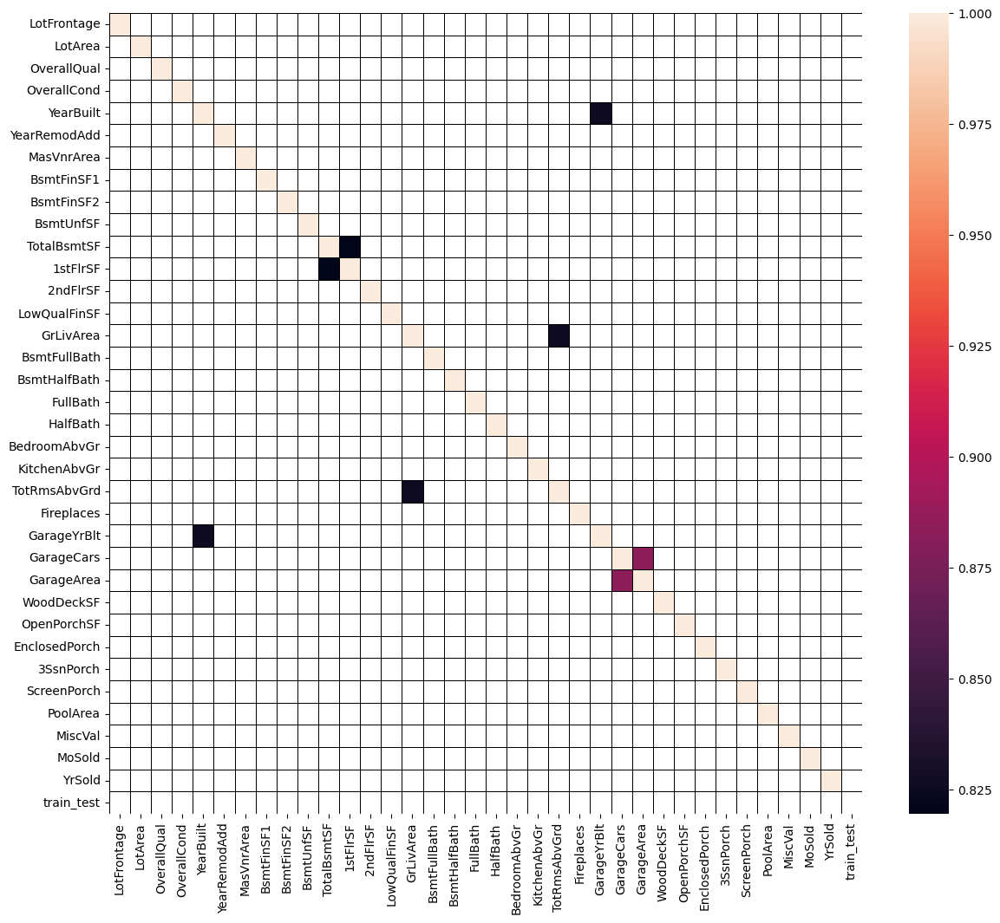

In [25]:
def plot_num_corr(show):
    if(show==True):
        plt.figure(figsize=(14,12))
        correlation = train[numerical_cols].corr()
        sns.heatmap(correlation, mask = correlation <0.8,linecolor='black',linewidth=.5)
plot_num_corr(show)

**GarageYrBlt and YearBuilt**

**1stFlrSF and TotalBsmtSF**

**GarageArea and GarageCars**

**TotRmsAbvGrd and GrLivArea**

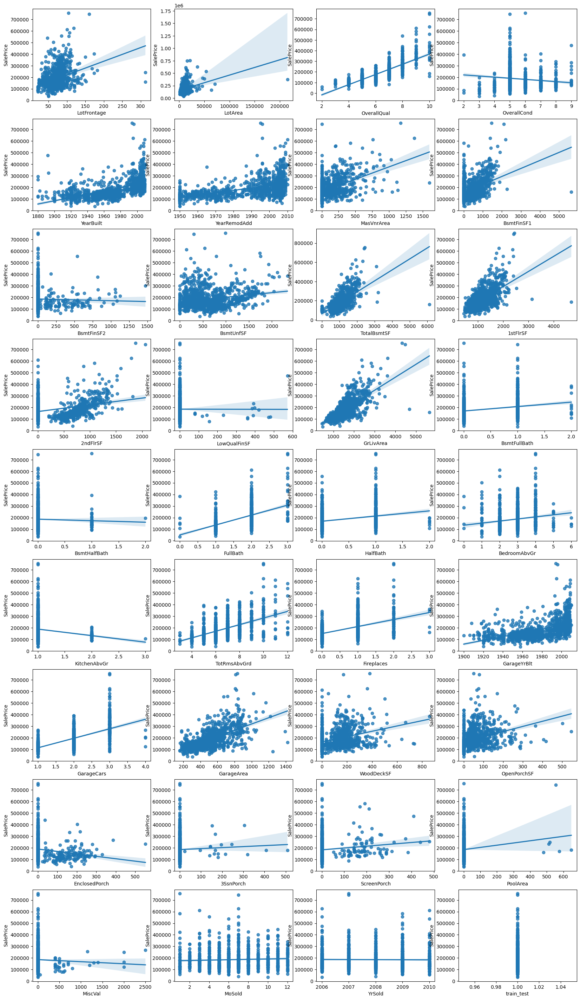

In [26]:
def plot_num_reg(show):
    if(show==True):
        fig = plt.figure(figsize = (20,40))
        ax = []
        for i,val in enumerate(numerical_cols):
            ax.append(fig.add_subplot(10,4,i+1))
            ax.append(sns.regplot(x=val,y='SalePrice', data = pd.concat(
            [train[numerical_cols],y],axis=1).dropna()))
        plt.show()
        fig.tight_layout()
plot_num_reg(show)

**Features with mostly 0s have poor correlations with SalePrice.**

**YrSold and MoSold have no correlation with the SalePrice and should be removed.**

**4.3) Categorical Features**

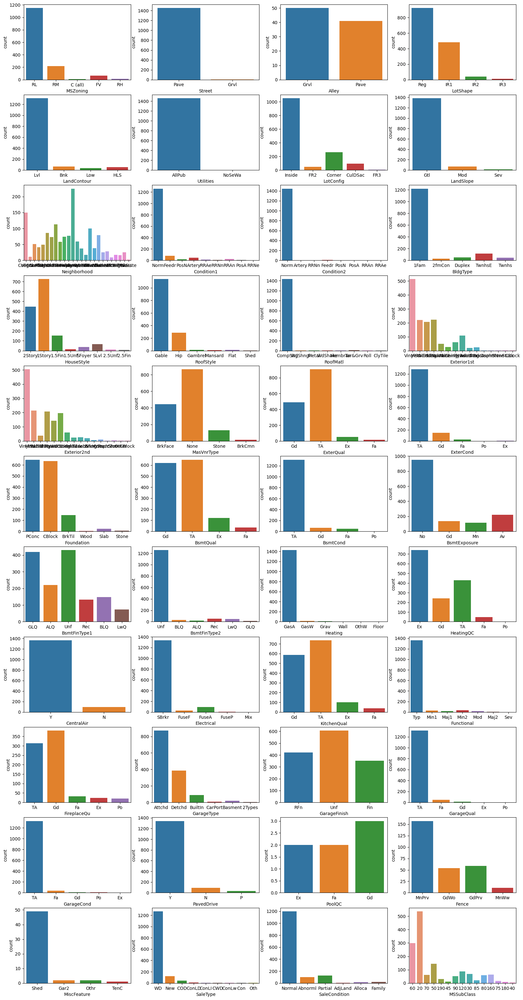

In [27]:
def plot_cat_count(show):
    if(show==True):
        fig = plt.figure(figsize = (20,40))
        ax = []
        for i,val in enumerate(categorical_cols):
            ax.append(fig.add_subplot(11,4,i+1))
            #print(val)
            ax.append(sns.countplot(data = train,x=val))
        plt.show()
        fig.tight_layout()
plot_cat_count(show)

**Highest Cardinality Features: 'Neighborhood', 'Exterior1st', 'Exterior2nd'**

In [28]:
overfit_cat = []
for i in categorical_cols:
    counts = train[i].value_counts()
    zeros = counts.iloc[0]
    if zeros / len(train) * 100 > 95:
        overfit_cat.append(i)

overfit_cat = list(overfit_cat)
print(overfit_cat)

['Street', 'Utilities', 'Condition2', 'RoofMatl', 'Heating']


In [29]:
def cat_box():
    fig = plt.figure(figsize = (20,40))
    for i,val in enumerate(categorical_cols):
        print(val)
        sns.catplot(x=val,y='SalePrice', data = pd.concat(
            [train[categorical_cols],y],axis=1),kind='box')
    plt.show()
    fig.tight_layout()

#cat_box()

**4.4) NA Values**

              Features
PoolQC        0.995205
MiscFeature   0.963014
Alley         0.937671
Fence         0.807534
FireplaceQu   0.472603
LotFrontage   0.177397
GarageYrBlt   0.055479
GarageCond    0.055479
GarageType    0.055479
GarageFinish  0.055479
GarageQual    0.055479
BsmtExposure  0.026027
BsmtFinType2  0.026027
BsmtCond      0.025342
BsmtQual      0.025342
BsmtFinType1  0.025342
MasVnrArea    0.005479
MasVnrType    0.005479
Electrical    0.000685


<Axes: ylabel='Features'>

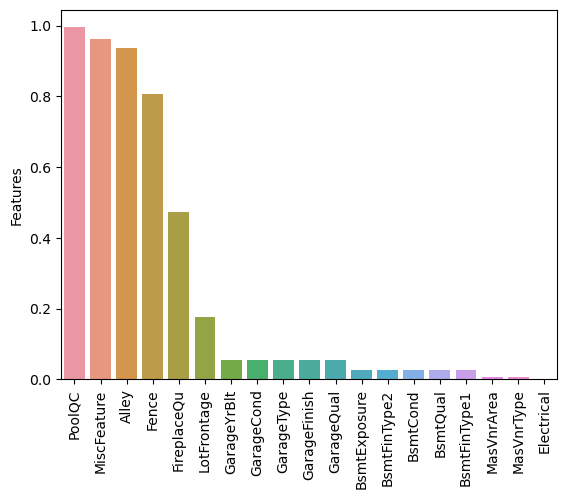

In [30]:
NA_df = pd.DataFrame({'Features':train.isnull().sum(axis = 0)/len(train)}).sort_values(by = 'Features',ascending = False)
NA_df = NA_df.loc[NA_df['Features']!=0]
print(NA_df)
plt.xticks(rotation='vertical')
sns.barplot(x=NA_df.index,y = NA_df.Features)

# 5) Data Cleaning

**5.1) Removing Useless Features**

**In the previous section we defined useless features:**

**1)No Correlation with SalePrice: 'YrSold', 'MoSold'**

**2)Quasi-constant Categorical: 'Street', 'Utilities', 'Condition2', 'RoofMatl', 'Heating'**
     
**3)Quasi-constant Numerical: 'LowQualFinSF', 'KitchenAbvGr', '3SsnPorch', 'PoolArea', 'MiscVal'**

In [31]:
train = train.drop(['MoSold','Street', 'Utilities', 'Condition2', 'RoofMatl',
                    'Heating','LowQualFinSF', 'KitchenAbvGr', 'MiscVal','PoolArea'],axis = 1)
test = test.drop(['MoSold','Street', 'Utilities', 'Condition2', 'RoofMatl', 
                    'Heating','LowQualFinSF', 'KitchenAbvGr', 'MiscVal','PoolArea'],axis = 1)
X = X.drop(['MoSold','Street', 'Utilities', 'Condition2', 'RoofMatl',
                    'Heating','LowQualFinSF', 'KitchenAbvGr', 'MiscVal','PoolArea'],axis = 1)

**Keep'YrSold' for time being as may be useful in feature engineering.**

**5.2) Removing Outliers**

**I realised that the maximum year in GarageYrBlt is 2207 which is clearly a typo, lets fix this**

In [32]:
print(test.loc[test['GarageYrBlt']==2207])

     MSSubClass MSZoning  LotFrontage  LotArea Alley LotShape LandContour  \
Id                                                                          
2593         20       RL         68.0     8298   NaN      IR1         HLS   

     LotConfig LandSlope Neighborhood Condition1 BldgType HouseStyle  \
Id                                                                     
2593    Inside       Gtl       Timber       Norm     1Fam     1Story   

      OverallQual  OverallCond  YearBuilt  YearRemodAdd RoofStyle Exterior1st  \
Id                                                                              
2593            8            5       2006          2007       Hip     VinylSd   

     Exterior2nd MasVnrType  MasVnrArea ExterQual ExterCond Foundation  \
Id                                                                       
2593     VinylSd        NaN         NaN        Gd        TA      PConc   

     BsmtQual BsmtCond BsmtExposure BsmtFinType1  BsmtFinSF1 BsmtFinType2  \
Id     

In [33]:
test.loc[2593,'GarageYrBlt'] = 2007
X.loc[2593,'GarageYrBlt'] = 2007

**Make some boxplots for the worst outliers**

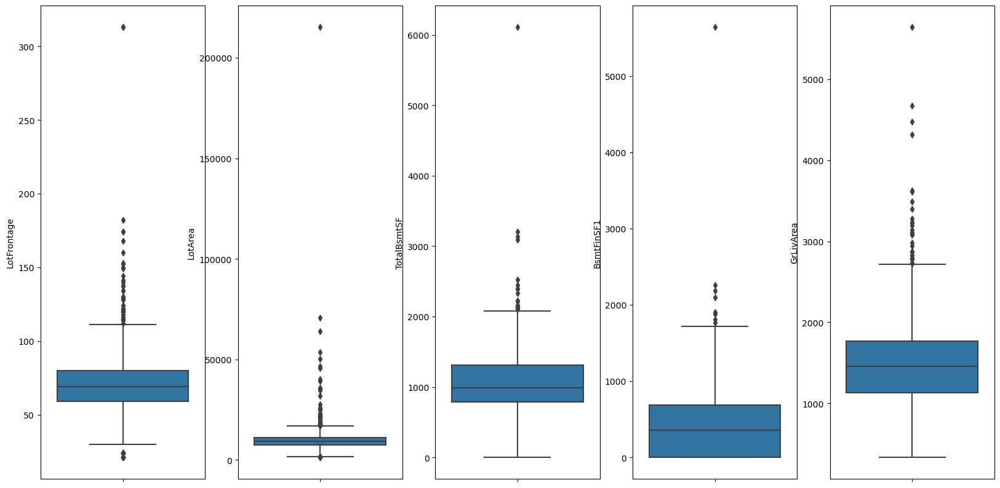

In [34]:
worst_outliers = ['LotFrontage','LotArea','TotalBsmtSF','BsmtFinSF1', 'GrLivArea']
fig = plt.figure(figsize = (20,10))
ax = []
for i,val in enumerate(worst_outliers):
    ax.append(fig.add_subplot(1,5,i+1))
    ax.append(sns.boxplot(y=val, data = train[worst_outliers].dropna()))
plt.show()
fig.tight_layout()

In [35]:
train = pd.concat([train,y],axis = 1)

print(train[train['LotFrontage'] > 250].index)
print(train[train['LotArea'] > 200000].index)
#print(train[train['BsmtFinSF1'] > 4000].index) #This is also 1299
print(train[train['TotalBsmtSF'] > 5000].index)
print(train[(train['GrLivArea'] > 4000) & (train['SalePrice'] < 300000)].index)
print(train[(train['OverallQual'] < 5) & (train['SalePrice'] > 200000)].index)
print(train[(train['OverallCond'] < 5) & (train['SalePrice'] > 300000)].index)

y = train.SalePrice
train = train.drop('SalePrice',axis = 1)

Int64Index([935, 1299], dtype='int64', name='Id')
Int64Index([314], dtype='int64', name='Id')
Int64Index([1299], dtype='int64', name='Id')
Int64Index([524, 1299], dtype='int64', name='Id')
Int64Index([458], dtype='int64', name='Id')
Int64Index([379], dtype='int64', name='Id')


In [36]:
train = train.drop([935,1299,314,524,458,379])
y = y.drop([935,1299,314,524,458,379])

**Tried removing extra outliers but didn't improve results**

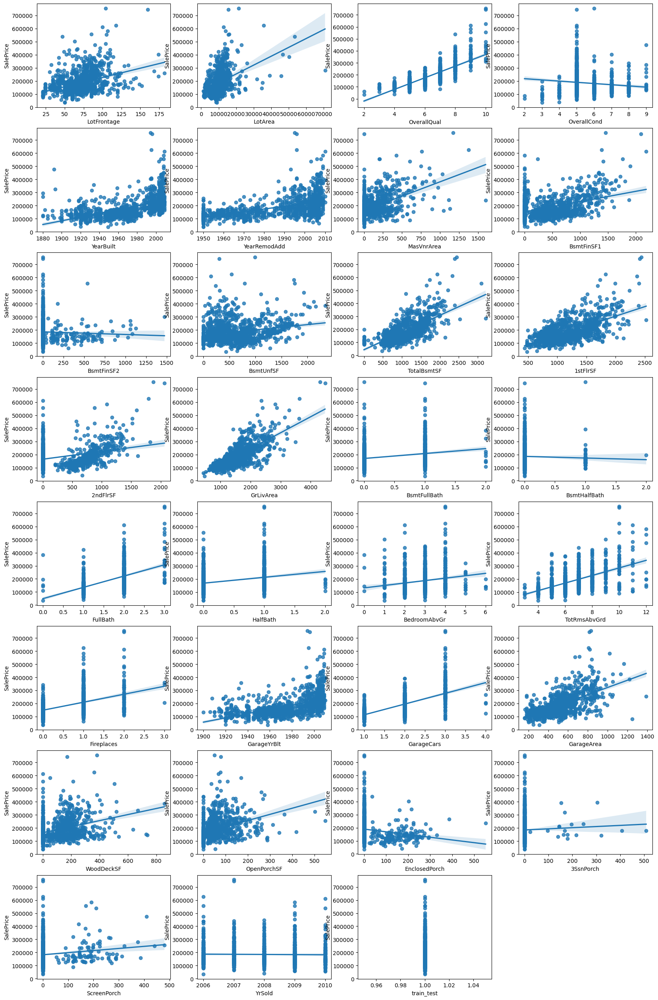

In [37]:
def plot_num_reg(show):
    if(show==True):
        fig = plt.figure(figsize = (20,40))
        ax = []
        numerical_cols = train.select_dtypes(exclude=['object']).columns.tolist()
        for i,val in enumerate(numerical_cols):
            ax.append(fig.add_subplot(10,4,i+1))
            ax.append(sns.regplot(x=val,y='SalePrice', data = pd.concat(
            [train[numerical_cols],y],axis=1).dropna()))
        plt.show()
        fig.tight_layout()
plot_num_reg(show)

**5.3) Filling NA values**

**Firstly, combine train and test data again to account for the outliers we removed.**

In [38]:
X = pd.concat([train,test])  #Train values on top, test below
#print(X.head())
print('Should have 2919-6 values:' + str((2913==len(X))))

Should have 2919-6 values:True


              Features
PoolQC        0.996910
MiscFeature   0.963955
Alley         0.932029
Fence         0.803982
FireplaceQu   0.487470
LotFrontage   0.166495
GarageYrBlt   0.054583
GarageCond    0.054583
GarageQual    0.054583
GarageFinish  0.054583
GarageType    0.053896
BsmtExposure  0.028150
BsmtCond      0.028150
BsmtQual      0.027806
BsmtFinType2  0.027463
BsmtFinType1  0.027120
MasVnrType    0.008239
MasVnrArea    0.007896
MSZoning      0.001373
BsmtHalfBath  0.000687
BsmtFullBath  0.000687
Functional    0.000687
BsmtFinSF2    0.000343
BsmtUnfSF     0.000343
BsmtFinSF1    0.000343
GarageArea    0.000343
GarageCars    0.000343
KitchenQual   0.000343
Exterior2nd   0.000343
Exterior1st   0.000343
Electrical    0.000343
SaleType      0.000343
TotalBsmtSF   0.000343


<Axes: ylabel='Features'>

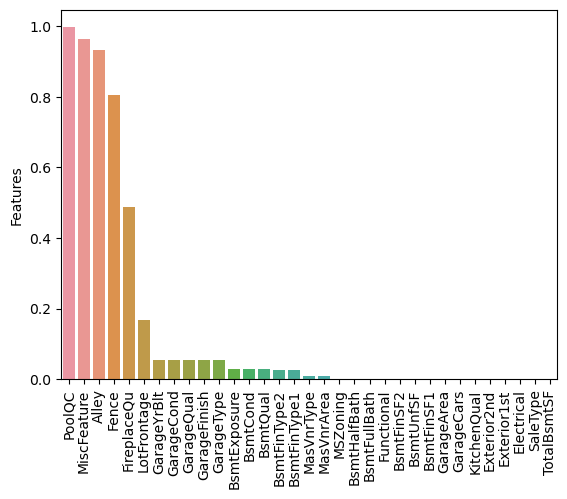

In [39]:
NA_df = pd.DataFrame({'Features':X.isnull().sum(axis = 0)/len(X)}).sort_values(by = 'Features',ascending = False)
NA_df = NA_df.loc[NA_df['Features']!=0]
print(NA_df)
plt.xticks(rotation='vertical')
sns.barplot(x=NA_df.index,y = NA_df.Features)

**Now lets fill the na values of the combined dataset. The training and test set should usually be filled seperately to avoid train-test contamination. However, I am testing my model on the kaggle leader-board and found it benefitted from the combined dataset imputation so I will do it this way here.**

**PoolQC,MiscFeature,Alley,Fence,FirePlaceQu: All NA here means there isn't one of them**

In [40]:
X[['PoolQC','MiscFeature','Alley','Fence','FireplaceQu']] = X[['PoolQC','MiscFeature','Alley','Fence','FireplaceQu']].fillna('None')

**LotFrontage: Replace with median for neighbourhood**

In [41]:
X["LotFrontage"] = X.groupby("Neighborhood")["LotFrontage"].transform(lambda x: x.fillna(x.median()))
#t = X.groupby("Neighborhood")["LotFrontage"].transform(lambda x: x.fillna(x.median()))
#a = X.groupby("Neighborhood")["LotFrontage"].apply(lambda x: x.fillna(x.median()))
#print(t)
#print(a)
#print((a==t).sum())
#Transform applied to groupby object keeps dims and apply drops rows. As just filling na, either can be used here. 
#https://stackoverflow.com/questions/41476436/pandas-transform-vs-apply

**GarageFinish,GarageQual,GarageCond,GarageType: All Na here means No Garage**

In [42]:
X[['GarageFinish','GarageQual','GarageCond','GarageType']] =X[['GarageFinish','GarageQual','GarageCond','GarageType']].fillna('None')

**BsmtCond,BsmtExposure,BsmtQual,BsmtFinType2,BsmtFinType1: All Na here means no Basement**

In [43]:
X[['BsmtCond','BsmtExposure','BsmtQual','BsmtFinType2','BsmtFinType1']] = X[['BsmtCond','BsmtExposure','BsmtQual','BsmtFinType2','BsmtFinType1']].fillna('None')

**MasVnrType and MasVnrArea: Na means None and 0 area here**

In [44]:
X['MasVnrType'] = X['MasVnrType'].fillna('None')
X['MasVnrArea'] = X['MasVnrArea'].fillna(0)

**MSZoning: Use MSSubclass grouping and mode to fillna**

In [45]:
#group = X.groupby('MSSubClass')
#print(group['MSZoning'].describe())
X['MSZoning'] = X.groupby('MSSubClass')['MSZoning'].transform(lambda x: x.fillna(x.mode()[0]))

**Functional: NA means Typ**

In [46]:
X['Functional'] = X['Functional'].fillna('Typ')

**BsmtFullBath,BsmtHalfBath,BsmtFinSF1,BsmtFinSF2: NA likely means 0 here**

In [47]:
X[['BsmtFullBath','BsmtHalfBath','BsmtFinSF1','BsmtFinSF2']] = X[['BsmtFullBath','BsmtHalfBath','BsmtFinSF1','BsmtFinSF2']].fillna(0)

**KitchenQual,Electrical,SaleType, Exterior1st and Exterior2nd: Only 1 missing value in each here, fill with mode for neighbourhood**

In [48]:
X['KitchenQual'] = X.groupby("Neighborhood")["KitchenQual"].transform(lambda x: x.fillna(x.mode()[0]))
X['Electrical'] = X.groupby("Neighborhood")["Electrical"].transform(lambda x: x.fillna(x.mode()[0]))
X['SaleType'] = X.groupby("Neighborhood")["SaleType"].transform(lambda x: x.fillna(x.mode()[0]))
X['Exterior1st'] = X.groupby("Neighborhood")["Exterior1st"].transform(lambda x: x.fillna(x.mode()[0]))
X['Exterior2nd'] = X.groupby("Neighborhood")["Exterior2nd"].transform(lambda x: x.fillna(x.mode()[0]))

**GarageYrBlt and GarageCars should be replace with 0**

In [49]:
X['GarageYrBlt'] = X['GarageYrBlt'].fillna(0)
X['GarageCars'] = X['GarageCars'].fillna(0)

**TotalBsmtSF,BsmtUnfSF and GarageArea remain. Look at rows with na value:**

In [50]:
print(X.loc[X['TotalBsmtSF'].isna()].index)
print(X.loc[X['BsmtUnfSF'].isna()].index)
print(X.loc[X['GarageArea'].isna()].index)

Int64Index([2121], dtype='int64', name='Id')
Int64Index([2121], dtype='int64', name='Id')
Int64Index([2577], dtype='int64', name='Id')


**Can see that 2121 has no basement so replace with None and 2577 has no garage so replace with 0**

In [51]:
X[['TotalBsmtSF','BsmtUnfSF']] = X[['TotalBsmtSF','BsmtUnfSF']].fillna(0)
X['GarageArea'] = X['GarageArea'].fillna(0)

**Check all na values have been imputed**

In [52]:
NA_df = pd.DataFrame({'Features':X.isnull().sum(axis = 0)/len(X)}).sort_values(by = 'Features',ascending = False)
NA_df = NA_df.loc[NA_df['Features']!=0]
print(NA_df)

Empty DataFrame
Columns: [Features]
Index: []


**5.4) Mapping Categorical Features**

In [53]:
print(X.select_dtypes(include=['object']).info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2913 entries, 1 to 2919
Data columns (total 39 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   MSSubClass     2913 non-null   object
 1   MSZoning       2913 non-null   object
 2   Alley          2913 non-null   object
 3   LotShape       2913 non-null   object
 4   LandContour    2913 non-null   object
 5   LotConfig      2913 non-null   object
 6   LandSlope      2913 non-null   object
 7   Neighborhood   2913 non-null   object
 8   Condition1     2913 non-null   object
 9   BldgType       2913 non-null   object
 10  HouseStyle     2913 non-null   object
 11  RoofStyle      2913 non-null   object
 12  Exterior1st    2913 non-null   object
 13  Exterior2nd    2913 non-null   object
 14  MasVnrType     2913 non-null   object
 15  ExterQual      2913 non-null   object
 16  ExterCond      2913 non-null   object
 17  Foundation     2913 non-null   object
 18  BsmtQual       2913 non-null

**'LotShape', 'LandSlope', 'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'HeatingQC', 'KitchenQual', 'FireplaceQu', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence' are ordinal**

**'CentralAir' is binary**

**Rest are nominal**

**Unsure whether to convert: 'BsmtFinType1'?, 'BsmtFinType2'?**

**CentralAir is Binary so convert N to 0 and Y to 1**

In [54]:
X['CentralAir'] = X['CentralAir'].map({'N':0,'Y':1})

**LotShape**

In [55]:
X['LotShape'] = X['LotShape'].map({'IR3':1,'IR2':2,'IR1':3,'Reg':4})

**LandSlope**

In [56]:
X['LandSlope'] = X['LandSlope'].map({'Gtl':1,'Mod':2,'Sev':3})

**'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond', 'GarageQual', 'GarageCond', 'KitchenQual', 'HeatingQC', 'FireplaceQu', PoolQC**

In [57]:
QualCondMap = {'Ex': 5,'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1, 'None':0}
for col in ['ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond', 'GarageQual', 'GarageCond', 'KitchenQual', 'HeatingQC', 'FireplaceQu','PoolQC']:
    X[col] = X[col].map(QualCondMap)

**'BsmtExposure'**

In [58]:
X['BsmtExposure'] = X['BsmtExposure'].map({'None':0,'No':1,'Mn':2,'Av':3,'Gd':4})

**'GarageFinish'**

In [59]:
X['GarageFinish'] = X['GarageFinish'].map({'None':0,'Unf':1,'RFn':2,'Fin':3})

**PavedDrive**

In [60]:
X['PavedDrive'] = X['PavedDrive'].map({'N':1,'P':2,'Y':3})

**Fence**

In [61]:
X['Fence'] = X['Fence'].map({'GdPrv': 4,'MnPrv': 3,'GdWo': 2, 'MnWw': 1,'None': 0})

**BsmtFinType1 and BsmtFinType2**

In [62]:
#X['BsmtFinType1'] = X['BsmtFinType1'].map({'None':0,'Unf':1,'LwQ':2,'Rec':3,'BLQ':4,'ALQ':5,'GLQ':6})
#X['BsmtFinType2'] = X['BsmtFinType2'].map({'None':0,'Unf':1,'LwQ':2,'Rec':3,'BLQ':4,'ALQ':5,'GLQ':6})

#Performs slightly better as Nominal feature here

In [63]:
print(X.columns)

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Alley', 'LotShape',
       'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1',
       'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt',
       'YearRemodAdd', 'RoofStyle', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'HeatingQC',
       'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'GrLivArea',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
       'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces',
       'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish',
       'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive',
       'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
       'ScreenPorch', 'PoolQC', 'Fence', 'M

In [64]:
#print(X.head())

# 6) Feature Engineering

**Add some new features representing totals and presence**

In [65]:
X['TotalLot'] = X['LotFrontage'] + X['LotArea']
X['TotalBsmtFin'] = X['BsmtFinSF1'] + X['BsmtFinSF2']
X['TotalSF'] = X['TotalBsmtSF'] + X['1stFlrSF'] + X['2ndFlrSF']  #Got rid of 1stFlrSF ealier so this is new total
X['TotalSFinclGarage'] = X['TotalBsmtSF'] + X['1stFlrSF'] + X['2ndFlrSF'] +X['GarageArea']
X['TotalBath'] = X['FullBath'] + (0.5 * X['HalfBath']) + X['BsmtFullBath'] + (0.5*X['BsmtHalfBath'])
X['TotalPorch'] = X['OpenPorchSF'] + X['EnclosedPorch'] + X['ScreenPorch'] + X['3SsnPorch']
X['OverallQxOverallC'] = (X['OverallCond']*X['OverallQual'])   #Multiplying together gives better score
X['ExtQxOverallQ'] = (X['OverallQual']*X['ExterQual'])   #Multiplying together gives better score
X['RemodYrBuilt'] = X['YearRemodAdd'] - X['YearBuilt']
X['YrsSinceRemod'] = X['YrSold']-X['YearRemodAdd'] 
X = X.drop('YrSold',axis = 1)

X['HasPool'] = X['PoolQC'].apply(lambda x: 1 if x > 0 else 0)
X['HasPorch'] = X['TotalPorch'].apply(lambda x: 1 if x > 0 else 0)
X['HasBsmt'] = X['TotalBsmtFin'].apply(lambda x: 1 if x > 0 else 0)
X['HasGarage'] = X['GarageArea'].apply(lambda x: 1 if x > 0 else 0)
X['HasFireplace'] = X['Fireplaces'].apply(lambda x: 1 if x > 0 else 0)
X['Has2ndFloor'] = X['2ndFlrSF'].apply(lambda x: 1 if x > 0 else 0)
X['HasWoodDeck'] =  X['WoodDeckSF'].apply(lambda x: 1 if x > 0 else 0)
X['HasMasVnr'] = X['MasVnrArea'].apply(lambda x: 1 if x > 0 else 0)
X['HasAlley'] = X['Alley'].apply(lambda x: 0 if x == 'None' else 1)
X['Has3SsnPorch'] = X['3SsnPorch'].apply(lambda x: 1 if x > 0 else 0)
X['HasScreenPorch']  = X['ScreenPorch'].apply(lambda x: 1 if x > 0 else 0)
#X['HasEnclosedPorch'] = X['EnclosedPorch'].apply(lambda x: 1 if x > 0 else 0)
#X = X.drop('PoolQC',axis = 1)

X["SimplMSZoning"] = X.MSZoning.map({'C (all)':1, 'RH':2, 'RM':2, 'RL':3, 'FV':4})
X['GarageCarsxArea'] = X['GarageCars'] * X['GarageArea']
X["TotalSFxOverallQual"] = X["TotalSF"] * X["OverallQual"] #Very Good Feature
X["GrLivAreaxOverallQual"] = X["GrLivArea"] * X["OverallQual"] #Very Good Feature
X["SimplMSZoningxTotalSF"] = X["SimplMSZoning"] * X["TotalSF"] #Very Good Feature
X["SimplMSZoning+OverallQual"] = X["SimplMSZoning"] + X["OverallQual"] #Very Good Feature
X["SimplMSZoning+YearBuilt"] = X["SimplMSZoning"] + X["YearBuilt"] #Very Good Feature
X["LotAreaxOverallQual"] = X["LotArea"] * X["OverallQual"] #Could be worth adding
#X['KitchenQualxOverallQxOverallC'] = X['KitchenQual'] * X['OverallQxOverallC']

numerical_cols = X.select_dtypes(exclude=['object']).columns.tolist()
numerical_cols.remove('train_test')
correlation = pd.concat([X[numerical_cols],y],axis = 1).corr()
correlation = abs(correlation[['SalePrice']]).sort_values(['SalePrice'], ascending=False)
print(correlation)

correlation = correlation.index.tolist()
print(correlation[1:11])

#Polynomial features of the best 10 
cols = correlation[1:11]

for col in cols: 
    X[col+'-2'] = X.loc[:,col]**2
    X[col+'-3'] = X.loc[:,col]**3
    X[col+'-sqrt'] = np.sqrt(np.absolute(X.loc[:,col]))

                           SalePrice
SalePrice                   1.000000
TotalSFxOverallQual         0.919563
GrLivAreaxOverallQual       0.875465
TotalSFinclGarage           0.855056
TotalSF                     0.832349
SimplMSZoningxTotalSF       0.827309
ExtQxOverallQ               0.821243
OverallQual                 0.797525
SimplMSZoning+OverallQual   0.790148
GrLivArea                   0.735626
ExterQual                   0.690860
GarageCarsxArea             0.683728
KitchenQual                 0.663382
TotalBsmtSF                 0.649342
GarageCars                  0.641003
TotalBath                   0.635615
GarageArea                  0.629322
1stFlrSF                    0.628755
BsmtQual                    0.585570
OverallQxOverallC           0.573787
FullBath                    0.566486
GarageFinish                0.549543
TotRmsAbvGrd                0.537392
SimplMSZoning+YearBuilt     0.526192
YearBuilt                   0.525191
FireplaceQu                 0.518400
Y

**Fix Skewage in Features**

In [66]:
numerical_cols = X.select_dtypes(exclude=['object']).columns.tolist()
numerical_cols.remove('train_test')
print(numerical_cols)

skew_features = X[numerical_cols].apply(lambda x: skew(x)).sort_values(ascending=False)
high_skew = skew_features[abs(skew_features) > 0.5]
print("There are {} numerical features with abs Skew > 0.5 :".format(high_skew.shape[0]))
skewness = pd.DataFrame({'Skew' :high_skew})
print(skewness)

['LotFrontage', 'LotArea', 'LotShape', 'LandSlope', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'HeatingQC', 'CentralAir', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Fireplaces', 'FireplaceQu', 'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolQC', 'Fence', 'TotalLot', 'TotalBsmtFin', 'TotalSF', 'TotalSFinclGarage', 'TotalBath', 'TotalPorch', 'OverallQxOverallC', 'ExtQxOverallQ', 'RemodYrBuilt', 'YrsSinceRemod', 'HasPool', 'HasPorch', 'HasBsmt', 'HasGarage', 'HasFireplace', 'Has2ndFloor', 'HasWoodDeck', 'HasMasVnr', 'HasAlley', 'Has3SsnPorch', 'HasScreenPorch', 'SimplMSZoning', 'GarageCarsxArea', 'TotalSFxOverallQ

In [67]:
pt = PowerTransformer()
X[high_skew.index] = pt.fit_transform(X[high_skew.index])

skew_features = X[numerical_cols].apply(lambda x: skew(x)).sort_values(ascending=False)
high_skew = skew_features[abs(skew_features) > 0.5]
print("There are {} numerical features with abs Skew > 0.5 :".format(high_skew.shape[0]))
skewness = pd.DataFrame({'Skew' :high_skew})
print(skewness)

There are 24 numerical features with abs Skew > 0.5 :
                     Skew
PoolQC          17.907255
HasPool         17.907255
3SsnPorch        8.703022
Has3SsnPorch     8.703022
LandSlope        4.261270
BsmtHalfBath     3.702652
HasAlley         3.432936
ScreenPorch      2.911229
HasScreenPorch   2.911229
BsmtFinSF2       2.356724
EnclosedPorch    1.879800
Fence            1.532136
GarageCond       1.512166
GarageQual       1.070689
BsmtCond         0.638209
RemodYrBuilt     0.588003
HalfBath         0.535046
LotShape        -0.599452
HasBsmt         -0.775400
HasPorch        -0.879841
PavedDrive      -2.753940
CentralAir      -3.454618
GarageYrBlt     -3.816024
HasGarage       -3.936249


**Check numerical data used in training**

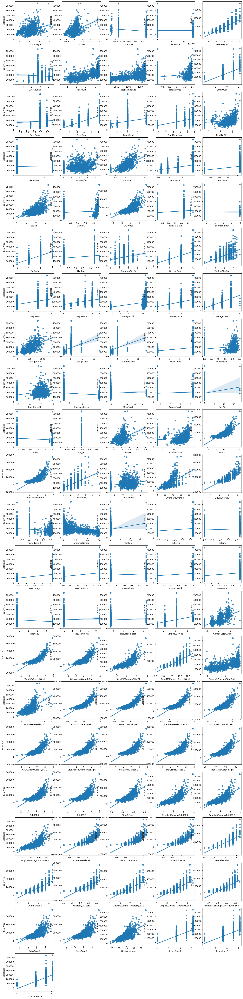

In [68]:
def plot_num_final(show):
    if(show==True):
        numerical_cols = X.select_dtypes(exclude=['object']).columns
        fig = plt.figure(figsize = (20,100))
        ax = []
        for i,val in enumerate(numerical_cols):
            ax.append(fig.add_subplot(25,5,i+1))
            ax.append(sns.regplot(x=val,y='SalePrice', data = pd.concat(
            [X.loc[X.train_test==1],y],axis=1)))
        plt.show()
        fig.tight_layout()
plot_num_final(show)

**Convert rest of Categorical Features using dummies**

In [69]:
X = pd.get_dummies(X)

**Have a final look at which features have the strongest correlation with SalePrice**

In [70]:
numerical_cols = X.select_dtypes(exclude=['object']).columns.tolist()
numerical_cols.remove('train_test')
correlation = pd.concat([X[numerical_cols],y],axis = 1).corr()
correlation = abs(correlation[['SalePrice']]).sort_values(['SalePrice'], ascending=False)
print(correlation)

                                SalePrice
SalePrice                        1.000000
TotalSFxOverallQual-2            0.864734
TotalSFxOverallQual-3            0.864734
TotalSFxOverallQual              0.864731
TotalSFxOverallQual-sqrt         0.864646
TotalSFinclGarage-sqrt           0.830002
GrLivAreaxOverallQual-3          0.822744
GrLivAreaxOverallQual-2          0.822744
GrLivAreaxOverallQual            0.822740
GrLivAreaxOverallQual-sqrt       0.822659
TotalSFinclGarage-3              0.819406
TotalSFinclGarage-2              0.819406
TotalSFinclGarage                0.819403
TotalSF-sqrt                     0.808887
SimplMSZoningxTotalSF-3          0.800432
SimplMSZoningxTotalSF-2          0.800432
SimplMSZoningxTotalSF            0.800431
OverallQual                      0.797525
TotalSF-3                        0.797477
TotalSF-2                        0.797477
TotalSF                          0.797473
SimplMSZoningxTotalSF-sqrt       0.795227
SimplMSZoning+OverallQual        0

# 7) Modelling

**Write Learning Curve and Validation Curve function to determine whether model is good fit**

In [71]:
def plot_learning_curve(estimator, X, y, cv,train_sizes):
    plt.figure()
    plt.title(str(estimator))
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=-1, train_sizes=train_sizes,scoring = 'neg_mean_squared_error')
    
    train_scores_mean = np.mean(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)

    plt.grid()
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")
    plt.legend(loc="best")
    return plt

In [72]:
def plot_validation_curves(model,X,y,param_name,param_range,cv):
    
    train_score, test_score = validation_curve(model, X_train, y,
                                           param_name=param_name,
                                           param_range=param_range,
                                           cv=cv, scoring="neg_mean_squared_error")
    mean_train_score = np.mean(train_score, axis=1)
    std_train_score = np.std(train_score, axis=1)

    mean_test_score = np.mean(test_score, axis=1)
    std_test_score = np.std(test_score, axis=1)
 
    #print(param_range)
    #print(mean_train_score)
    
    plt.plot(param_range, mean_train_score,
         label="Training Score", color='darkblue')
    plt.fill_between(param_range, mean_train_score - std_train_score,
                     mean_train_score + std_train_score,
                     color="lightblue",)
    
    plt.plot(param_range, mean_test_score,
         label="Cross Validation Score", color='darkgreen')
    plt.fill_between(param_range, mean_test_score - std_test_score,
                     mean_test_score + std_test_score,
                     color="lightgreen")
    plt.title(str(model))
    plt.xlabel(param_name)
    plt.ylabel("Score")
    plt.tight_layout()
    plt.legend(loc='best')

**Split back into Train and Test dataset**

In [73]:
X_train = X[X.train_test == 1].drop(['train_test'], axis =1)
X_test = X[X.train_test == 0].drop(['train_test'], axis =1)

**Apply log transformation on SalePrice to reduce the skewage**

<Axes: xlabel='SalePrice', ylabel='Count'>

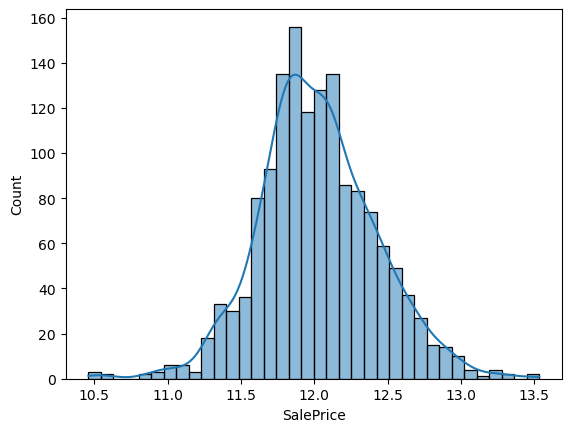

In [74]:
y = np.log(y)
sns.histplot(y,kde = True)

**Remove training constant and quasi-constant columns which may overfit the data. MSZoning_C is an example of this, it is over 99% 0s but has very large coefficients in my models.**

**Over 99.94% Corresponds to Constant. Over 99.93% Corresponds to all constant but 1. Over 99.86% corresponds to all constant but 2. Over 99.79% corresponds to all constant but 3. And so on...**

In [75]:
overfit = []
for i in X_train.columns:
    counts = X_train[i].value_counts()
    zeros = counts.iloc[0]
    if zeros / len(X_train) * 100 >99.94:
        overfit.append(i)
overfit.append('MSZoning_C (all)') #Largest coefficients in Regularization models but mostly0
print(overfit)

#Best Results are for removing only constant features#

['MSSubClass_150', 'MSZoning_C (all)']


In [76]:
X_train = X_train.drop(overfit, axis = 1)
X_test = X_test.drop(overfit, axis = 1)

**Try applying PCA as we have a large number of correlated features. This didn't improve results so I have not used it**

In [77]:
#from sklearn.decomposition import PCA
#train_index = X_train.index
#test_index = X_test.index
#print(len(X_train.columns))
#pca = PCA()
#X_train = pca.fit_transform(X_train)
#X_test = pca.transform(X_test)
#component_names = [f"PC{i+1}" for i in range(X_train.shape[1])]
#X_train = pd.DataFrame(X_train, columns=component_names, index = train_index)
#component_names = [f"PC{i+1}" for i in range(X_test.shape[1])]
#X_test = pd.DataFrame(X_test, columns=component_names, index = test_index)

**Finally, remove outliers which were found to have a negative impact on the regression. Many thanks to Jack Roberts for this idea! (https://www.kaggle.com/code/jack89roberts/top-7-using-elasticnet-with-interactions/notebook) I will only remove the very worst outliers which sigma >=4 to start with. Removing outliers with sigma >= 3 made results worse on LB but I will try remove outliers shared between models at this sigma at a later stage**

In [78]:
def rmse(y_true, y_pred):
    diff = y_pred - y_true
    sum_sq = sum(diff**2)    
    n = len(y_pred)   
    
    return np.sqrt(sum_sq/n)

# function to detect outliers based on the predictions of a model
def find_outliers(model, X_train, y, sigma):

    # predict y values using model
    try:
        y_pred = pd.Series(model.predict(X_train), index=y.index)
    # if predicting fails, try fitting the model first
    except:
        model.fit(X_train,y)
        y_pred = pd.Series(model.predict(X_train), index=y.index)
        
    # calculate residuals between the model prediction and true y values
    resid = y - y_pred
    mean_resid = resid.mean()
    std_resid = resid.std()

    # calculate z statistic, define outliers to be where |z|>sigma
    z = (resid - mean_resid)/std_resid    
    outliers = z[abs(z)>sigma].index
    
    # print and plot the results
    print(str(model))
    print('R2=',model.score(X_train,y))
    print('rmse=',rmse(y, y_pred))
    print('mean of residuals:',mean_resid)
    print('std of residuals:',std_resid)
    print('---------------------------------------')

    print(len(outliers),'outliers:')
    print(outliers.tolist())
    print('---------------------------------------')
    
    plt.figure(figsize=(15,5))
    ax_131 = plt.subplot(1,3,1)
    plt.plot(y,y_pred,'.')
    plt.plot(y.loc[outliers],y_pred.loc[outliers],'ro')
    plt.legend(['Accepted','Outlier'])
    plt.xlabel('y')
    plt.ylabel('y_pred');
    plt.title(str(model))
    
    ax_132=plt.subplot(1,3,2)
    plt.plot(y,y-y_pred,'.')
    plt.plot(y.loc[outliers],y.loc[outliers]-y_pred.loc[outliers],'ro')
    plt.legend(['Accepted','Outlier'])
    plt.xlabel('y')
    plt.ylabel('y - y_pred');
    plt.title(str(model))
    
    ax_133=plt.subplot(1,3,3)
    z.plot.hist(bins=50,ax=ax_133)
    z.loc[outliers].plot.hist(color='r',bins=50,ax=ax_133)
    plt.legend(['Accepted','Outlier'])
    plt.xlabel('z')
    plt.title(str(model))
    
    return outliers.tolist()

RidgeCV()
R2= 0.9428526118547034
rmse= 0.09529732698696677
mean of residuals: -2.1941794247337344e-15
std of residuals: 0.09533011464559628
---------------------------------------
11 outliers:
[31, 411, 463, 496, 589, 633, 969, 971, 1325, 1433, 1454]
---------------------------------------
ElasticNetCV()
R2= 0.8603417299201626
rmse= 0.14897584422074253
mean of residuals: -1.6957244106516834e-15
std of residuals: 0.1490271003186709
---------------------------------------
6 outliers:
[411, 633, 729, 969, 1182, 1325]
---------------------------------------
LassoCV()
R2= 0.8603627531557058
rmse= 0.148964630877858
mean of residuals: -6.377292091932124e-16
std of residuals: 0.1490158831177636
---------------------------------------
6 outliers:
[411, 633, 729, 969, 1182, 1325]
---------------------------------------
BayesianRidge()
R2= 0.9396180048395313
rmse= 0.09795717581646088
mean of residuals: 1.318218039692483e-15
std of residuals: 0.09799087861319751
-----------------------------------

/opt/conda/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


LinearSVR(random_state=0)
R2= 0.904352831739123
rmse= 0.12328736894179013
mean of residuals: 0.013326428422416306
std of residuals: 0.1226071791571714
---------------------------------------
7 outliers:
[31, 411, 463, 496, 633, 969, 1325]
---------------------------------------
[31, 411, 463, 496, 589, 633, 969, 971, 1325, 1433, 1454, 411, 633, 729, 969, 1182, 1325, 411, 633, 729, 969, 1182, 1325, 31, 411, 463, 496, 589, 633, 969, 971, 1325, 1433, 1454, 14, 633, 973, 1325, 31, 411, 463, 496, 633, 969, 1325]
633     6
1325    6
411     5
969     5
31      3
463     3
496     3
589     2
971     2
1433    2
1454    2
729     2
1182    2
14      1
973     1
dtype: int64
Number of shared outliers: 15


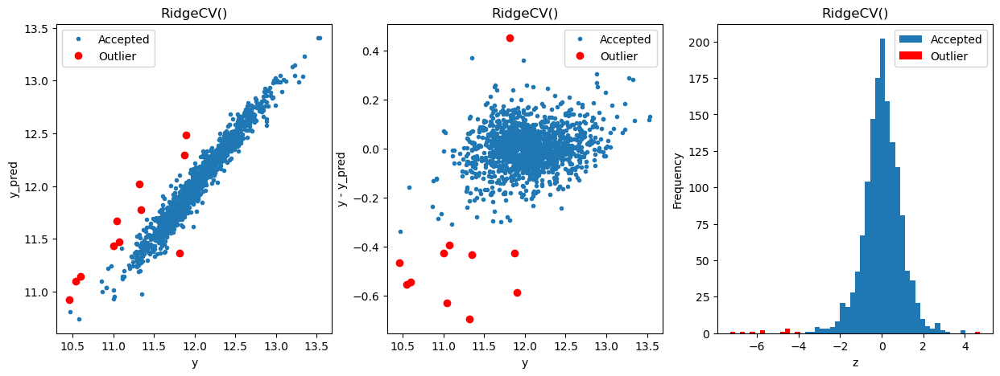

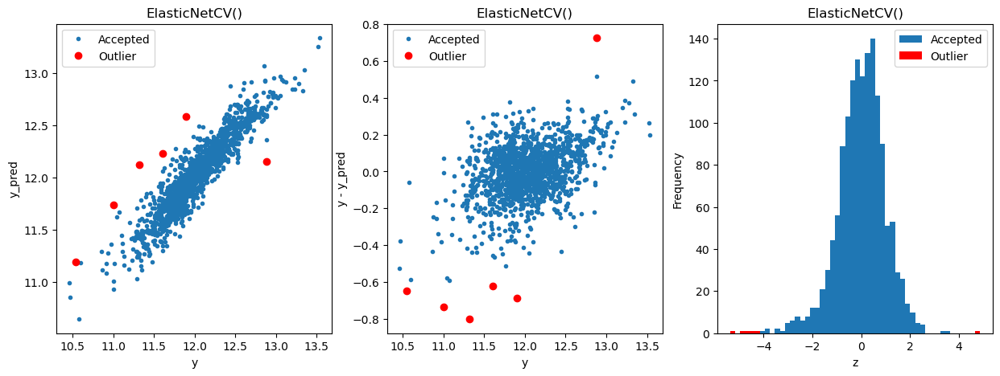

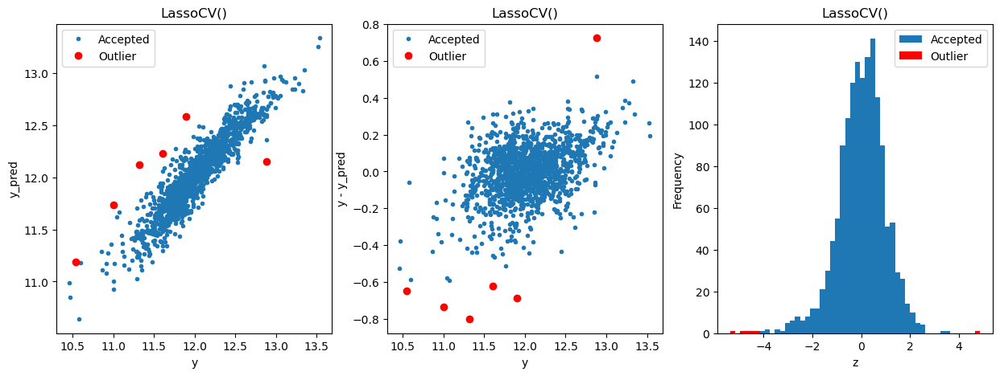

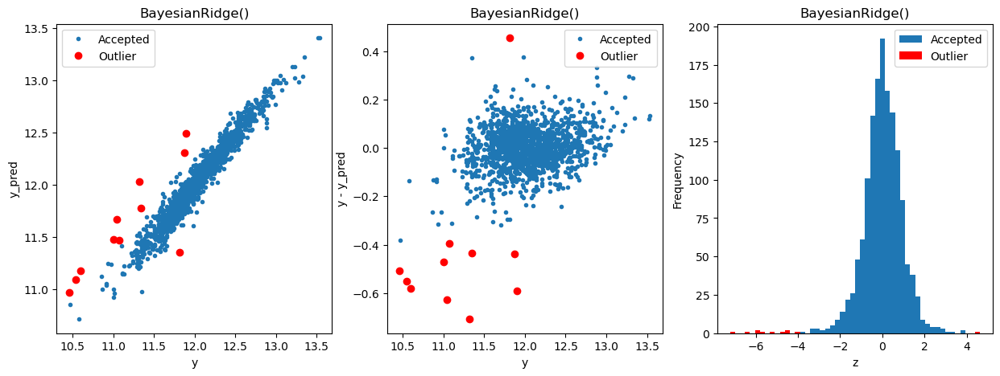

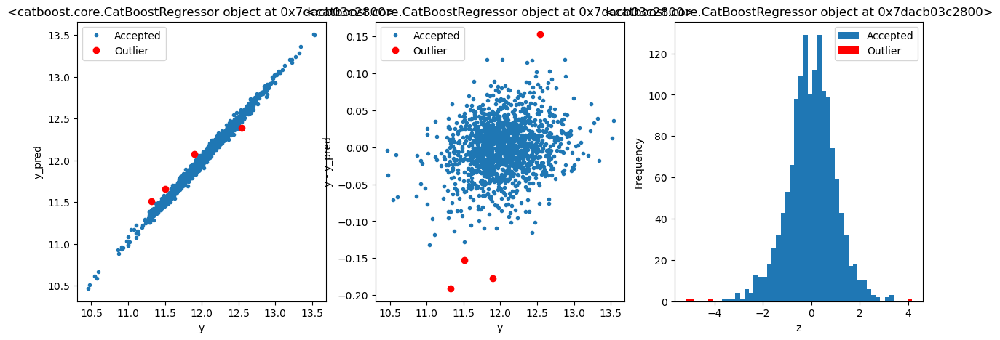

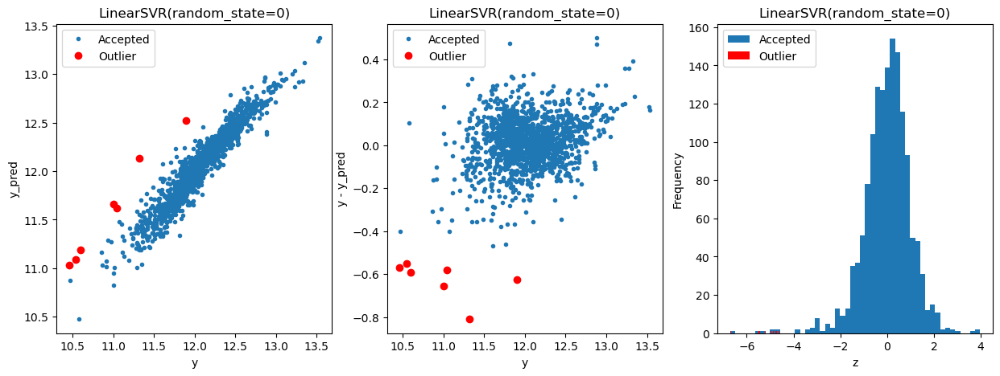

In [79]:
# After seeing the scores without removing outliers, I will use ridgeCV as the meta-model 
#when stacking so use this model as a basis for the outliers

#Look at outliers 4 sigma+ out
ridge_outliers = find_outliers(RidgeCV(), X_train, y,4)
elastic_outliers = find_outliers(ElasticNetCV(), X_train, y,4)
lasso_outliers = find_outliers(LassoCV(), X_train, y,4)
bayridge_outliers = find_outliers(linear_model.BayesianRidge(), X_train, y,4)
cbr_outliers = find_outliers(CatBoostRegressor(logging_level='Silent',loss_function = 'RMSE'), X_train, y,4)
#lgbm_outliers = find_outliers(LGBMRegressor(n_jobs=-1), X_train, y,4)
#gbr_outliers = find_outliers(GradientBoostingRegressor(random_state=0), X_train, y,4)
linsvr_outliers = find_outliers(LinearSVR(random_state=0), X_train, y,4)

outliers4 = ridge_outliers
outliers4.extend(elastic_outliers)
outliers4.extend(lasso_outliers)
outliers4.extend(bayridge_outliers)
outliers4.extend(cbr_outliers)
#outliers4.extend(lgbm_outliers)
#outliers4.extend(gbr_outliers),
outliers4.extend(linsvr_outliers)
print(outliers4)
outlier4_count = pd.Series(outliers4).value_counts()
print(outlier4_count)
print('Number of shared outliers: ' + str(len(outlier4_count)))

RidgeCV()
R2= 0.9428526118547034
rmse= 0.09529732698696677
mean of residuals: -2.1941794247337344e-15
std of residuals: 0.09533011464559628
---------------------------------------
20 outliers:
[31, 89, 411, 463, 496, 561, 589, 629, 633, 682, 689, 729, 804, 875, 917, 969, 971, 1325, 1433, 1454]
---------------------------------------
ElasticNetCV()
R2= 0.8603417299201626
rmse= 0.14897584422074253
mean of residuals: -1.6957244106516834e-15
std of residuals: 0.1490271003186709
---------------------------------------
15 outliers:
[31, 411, 440, 463, 496, 633, 667, 689, 729, 899, 969, 1182, 1325, 1384, 1433]
---------------------------------------
LassoCV()
R2= 0.8603627531557058
rmse= 0.148964630877858
mean of residuals: -6.377292091932124e-16
std of residuals: 0.1490158831177636
---------------------------------------
15 outliers:
[31, 411, 440, 463, 496, 633, 667, 689, 729, 899, 969, 1182, 1325, 1384, 1433]
---------------------------------------
BayesianRidge()
R2= 0.9396180048395313
rm

/opt/conda/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


LinearSVR(random_state=0)
R2= 0.904352831739123
rmse= 0.12328736894179013
mean of residuals: 0.013326428422416306
std of residuals: 0.1226071791571714
---------------------------------------
22 outliers:
[31, 67, 411, 463, 496, 561, 589, 633, 667, 689, 715, 729, 813, 899, 917, 969, 971, 1063, 1182, 1325, 1433, 1454]
---------------------------------------
689     6
899     3
561     3
875     3
917     3
667     3
813     2
715     2
1384    2
629     2
682     2
440     2
89      2
804     2
5       1
560     1
865     1
885     1
1023    1
1027    1
67      1
1063    1
dtype: int64
Number of shared outliers: 22


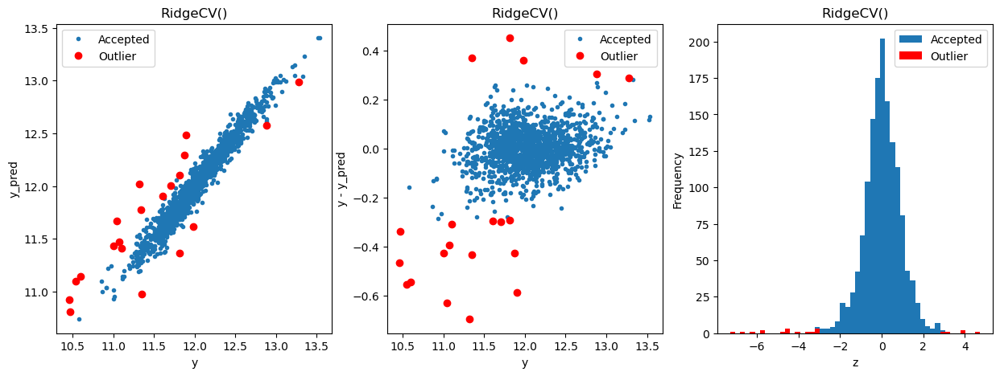

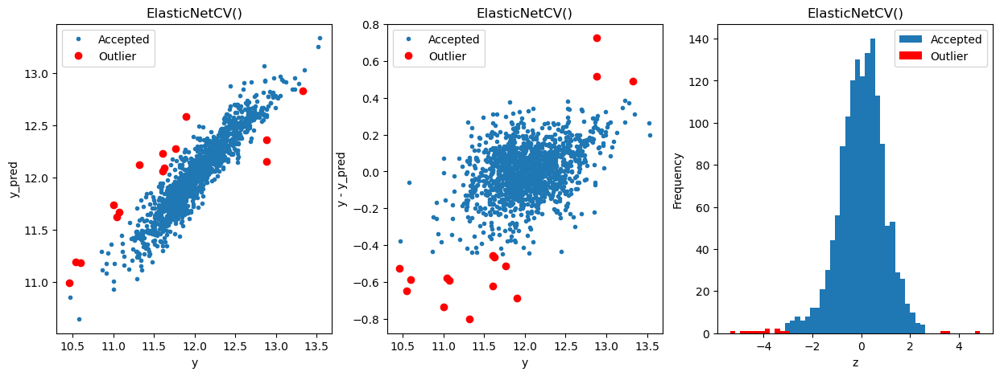

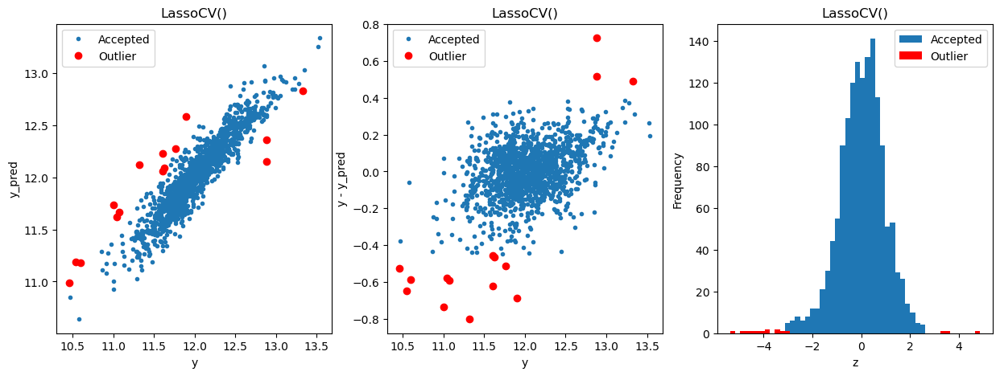

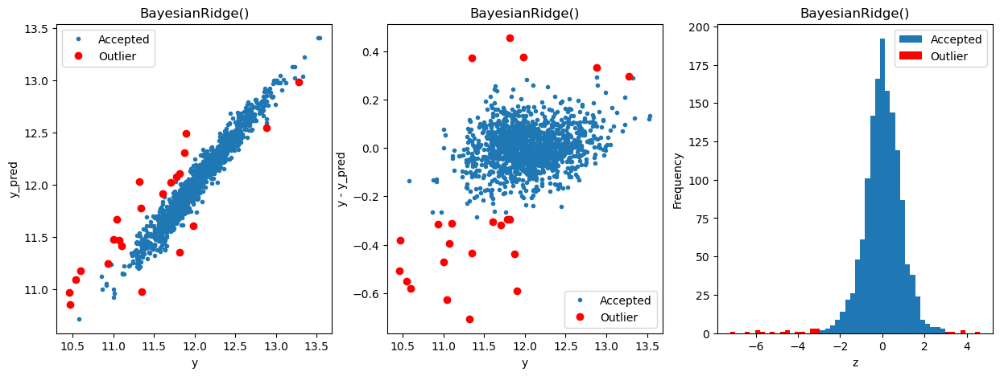

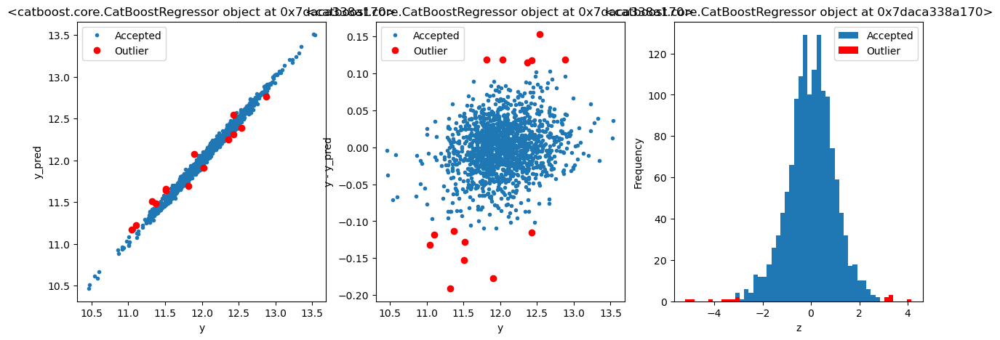

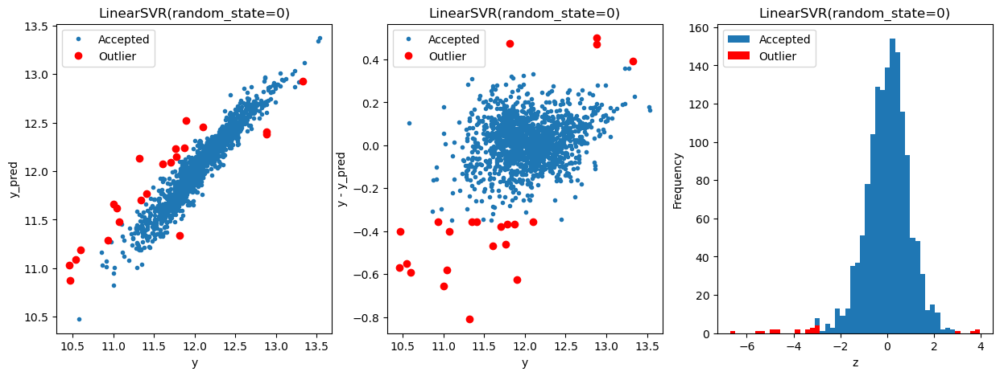

In [80]:
#Look at outliers 3 sigma+ out
ridge_outliers = find_outliers(RidgeCV(), X_train, y,3)
elastic_outliers = find_outliers(ElasticNetCV(), X_train, y,3)
lasso_outliers = find_outliers(LassoCV(), X_train, y,3)
bayridge_outliers = find_outliers(linear_model.BayesianRidge(), X_train, y,3)
cbr_outliers = find_outliers(CatBoostRegressor(logging_level='Silent',loss_function = 'RMSE'), X_train, y,3)
linsvr_outliers = find_outliers(LinearSVR(random_state=0), X_train, y,3)

outliers3 = ridge_outliers
outliers3.extend(elastic_outliers)
outliers3.extend(lasso_outliers)
outliers3.extend(bayridge_outliers)
outliers3.extend(cbr_outliers)
outliers3.extend(linsvr_outliers)

outlier3_count = pd.Series(outliers3).value_counts()
remove_outliers = outlier4_count.index.tolist()
for outlier in remove_outliers:
    outlier3_count = outlier3_count.drop(outlier)
    
print(outlier3_count)
print('Number of shared outliers: ' + str(len(outlier3_count)))

**Only drop the very worst outliers, dropping outliers at above 3 sigma worsened LB score so only remove outliers over 4 sigma here**

In [81]:
X_train = X_train.drop(outlier4_count.index)
y = y.drop(outlier4_count.index)

#X_train = X_train.drop(outlier3_count.loc[outlier3_count>3].index)
#y = y.drop(outlier3_count.loc[outlier3_count>3].index)

**Test a number of regression models using 5 fold cross validation and score using the same scoring system as in the leaderboards**

In [82]:
scores = {}
kf = KFold(10, shuffle=True, random_state=0)
lasso = Pipeline([('scaler',RobustScaler()),('lasso',LassoCV(n_jobs=-1))])
elastic = Pipeline([('scaler',RobustScaler()),('elastic',ElasticNetCV(n_jobs=-1))])
xgb = XGBRegressor(random_state=0,n_jobs=-1)
lgbm = LGBMRegressor(n_jobs=-1)
rf = RandomForestRegressor(n_jobs=-1)
cbr = CatBoostRegressor(logging_level='Silent',loss_function = 'RMSE') #no n_jobs
linsvr = Pipeline([('scaler',RobustScaler()),('svr',LinearSVR(random_state=0))])  #no n_jobs param
ridge = Pipeline([('scaler',RobustScaler()),('ridge',RidgeCV())]) #no n_jobs param
bayridge = Pipeline([('scaler',RobustScaler()),('bayridge',linear_model.BayesianRidge())]) #no n_jobs param
gbr = GradientBoostingRegressor(random_state=0) #no n_jobs param

def models_cv():
    scores = {}
    
    print('lasso')
    cv_lasso = np.sqrt(-cross_val_score(lasso,X_train,y,cv=kf,n_jobs=-1,scoring = 'neg_mean_squared_error'))
    print(cv_lasso)
    print(cv_lasso.mean())
    scores['lasso'] = cv_lasso.mean()
    
    print('elastic')
    cv_elastic = np.sqrt(-cross_val_score(elastic,X_train,y,cv=kf,n_jobs=-1,scoring = 'neg_mean_squared_error'))
    print(cv_elastic)
    print(cv_elastic.mean())
    scores['elastic'] = cv_elastic.mean()
    
    print('ridge')
    cv_ridge = np.sqrt(-cross_val_score(ridge,X_train,y,cv=kf,n_jobs=-1,scoring = 'neg_mean_squared_error'))
    print(cv_ridge)
    print(cv_ridge.mean())
    scores['ridge'] = cv_ridge.mean()
    
    print('bayridge')
    cv_bayridge = np.sqrt(-cross_val_score(bayridge,X_train,y,cv=kf,n_jobs=-1,scoring = 'neg_mean_squared_error'))
    print(cv_bayridge)
    print(cv_bayridge.mean())
    scores['bayridge'] = cv_bayridge.mean()
    
    print('xgb')
    cv_xgb = np.sqrt(-cross_val_score(xgb,X_train,y,cv=kf,n_jobs=-1,scoring = 'neg_mean_squared_error'))
    print(cv_xgb)
    print(cv_xgb.mean())
    scores['xgb'] = cv_xgb.mean()
    
    print('lgbm')
    cv_lgbm = np.sqrt(-cross_val_score(lgbm,X_train,y,cv=kf,n_jobs=-1,scoring = 'neg_mean_squared_error'))
    print(cv_lgbm)
    print(cv_lgbm.mean())
    scores['lgbm'] = cv_lgbm.mean()
    
    print('rf')
    cv_rf = np.sqrt(-cross_val_score(rf,X_train,y,cv=kf,n_jobs=-1,scoring = 'neg_mean_squared_error'))
    print(cv_rf)
    print(cv_rf.mean())
    scores['rf'] = cv_rf.mean()
    
    print('linsvr')
    cv_linsvr = np.sqrt(-cross_val_score(linsvr,X_train,y,cv=kf,n_jobs=-1,scoring = 'neg_mean_squared_error'))
    print(cv_linsvr)
    print(cv_linsvr.mean())
    scores['linsvr'] = cv_linsvr.mean()
    
    print('cbr')
    cv_cbr = np.sqrt(-cross_val_score(cbr,X_train,y,cv=kf,n_jobs=-1,scoring = 'neg_mean_squared_error'))
    print(cv_cbr)
    print(cv_cbr.mean())
    scores['cbr'] = cv_cbr.mean()
    
    print('gbr')
    cv_gbr = np.sqrt(-cross_val_score(gbr,X_train,y,cv=kf,n_jobs=-1,scoring = 'neg_mean_squared_error'))
    print(cv_gbr)
    print(cv_gbr.mean())
    scores['gbr'] = cv_gbr.mean()
    
    return scores
print(pd.Series(models_cv()).sort_values(ascending = True))

lasso


/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


[0.0908074  0.09491592 0.10399331 0.09976549 0.09750359 0.09775653
 0.08730386 0.10581248 0.08922465 0.09674157]
0.09638248039849652
elastic


/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.130e-02, tolerance: 1.976e-02
  model = cd_fast.enet_coordinate_descent(
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.460e-02, tolerance: 1.977e-02
  model = cd_fast.enet_coordinate_descent(
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.172e-02, tolerance: 1.976e

[0.09095767 0.09487823 0.10393164 0.09971824 0.09761498 0.09773775
 0.08749393 0.10566668 0.0893619  0.09686011]
0.09642211241038122
ridge
[0.08722759 0.09226743 0.10373188 0.09454356 0.09767351 0.09724965
 0.0868221  0.10394366 0.08709421 0.09772231]
0.09482759040325763
bayridge
[0.08747498 0.09220984 0.10366039 0.09485418 0.097549   0.09715447
 0.08683629 0.10385491 0.08718386 0.097776  ]
0.09485539097982114
xgb
[0.11251679 0.10400875 0.1307563  0.11330112 0.11422875 0.11519169
 0.11728437 0.13098639 0.10782681 0.10486664]
0.11509676122354077
lgbm
[0.09849069 0.09502993 0.12226506 0.10593804 0.10928136 0.11529584
 0.1024986  0.12207011 0.09702392 0.09416641]
0.10620599438245318
rf
[0.1174142  0.10548321 0.13517382 0.11741084 0.12599466 0.1214009
 0.11452819 0.14463229 0.11510771 0.10266781]
0.11998136148901906
linsvr


/opt/conda/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  w

[0.10907147 0.09950083 0.12126359 0.13326194 0.09634332 0.12619687
 0.11575599 0.12533911 0.10290219 0.1002037 ]
0.11298389908532855
cbr
[0.09113785 0.09229152 0.1142014  0.09869242 0.10106141 0.0978316
 0.09211883 0.10731031 0.09209558 0.09418629]
0.09809272115362945
gbr
[0.10329547 0.09745423 0.11515674 0.10518277 0.10827442 0.10888918
 0.0978251  0.12174869 0.09788269 0.09878449]
0.10544937844273958
ridge       0.094828
bayridge    0.094855
lasso       0.096382
elastic     0.096422
cbr         0.098093
gbr         0.105449
lgbm        0.106206
linsvr      0.112984
xgb         0.115097
rf          0.119981
dtype: float64


**Hyperparameter Tuning**

In [83]:
best_elastic = elastic
best_lasso = lasso
best_ridge = ridge
best_bayridge = bayridge
best_cbr = cbr
best_lgbm = lgbm
best_gbr = gbr
best_linsvr = linsvr
best_xgb = xgb

best_cbr.fit(X_train,y)
best_ridge.fit(X_train,y)
best_lasso.fit(X_train,y)
best_elastic.fit(X_train,y)
best_bayridge.fit(X_train,y)
best_lgbm.fit(X_train,y)
best_gbr.fit(X_train,y)
best_linsvr.fit(X_train,y)
best_xgb.fit(X_train,y)

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.122e-02, tolerance: 2.190e-02
  model = cd_fast.enet_coordinate_descent(
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.859e-02, tolerance: 2.190e-02
  model = cd_fast.enet_coordinate_descent(
/opt/conda/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=-1, num_parallel_tree=None,
             predictor=None, random_state=0, ...)

In [84]:
best_scores = {}

#cv_best_elastic = cross_val_score(best_elastic,X_train,y,cv=5,scoring = 'neg_mean_squared_error')
#print(cv_best_elastic)
#print(cv_best_elastic.mean())
#best_scores['best_elastic'] = cv_best_elastic.mean()

#cv_best_lasso = cross_val_score(best_lasso,X_train,y,cv=5,scoring = 'neg_mean_squared_error')
#print(cv_best_lasso)
#print(cv_best_lasso.mean())
#best_scores['best_lasso'] = cv_best_lasso.mean()

#cv_best_ridge = cross_val_score(best_ridge,X_train,y,cv=5,scoring = 'neg_mean_squared_error')
#print(cv_best_ridge)
#print(cv_best_ridge.mean())
#best_scores['best_ridge'] = cv_best_ridge.mean()

#cv_best_cbr = cross_val_score(best_cbr,X_train,y,cv=5,scoring = 'neg_mean_squared_error')
#print(cv_best_cbr)
#print(cv_best_cbr.mean())
#best_scores['best_cbr'] = cv_best_cbr.mean()

#cv_best_gbr = cross_val_score(best_gbr,X_train,y,cv=5,scoring = 'neg_mean_squared_error')
#print(cv_best_gbr)
#print(cv_best_gbr.mean())
#best_scores['best_gbr'] = cv_best_gbr.mean()

#cv_best_lgbm = cross_val_score(best_lgbm,X_train,y,cv=5,scoring = 'neg_mean_squared_error')
#print(cv_best_lgbm)
#print(cv_best_lgbm.mean())
#best_scores['best_lgbm'] = cv_best_lgbm.mean()

#print(best_scores)

In [85]:
#print(abs(pd.Series(best_scores)).sort_values(ascending = True))

**Plot Learning Curves to see overfitting/underfitting. I will only use this on lgbm, gbr and cbr when I start tuning parameters as using the cross validation on the regularization models it becomes very easy to see when they are fit well**

In [86]:
#plot_validation_curves(best_gbr,X_train,y,'n_estimators',[100,125,150,175,200],3)

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.496e-03, tolerance: 2.553e-03
  model = cd_fast.enet_coordinate_descent(
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.184e-03, tolerance: 3.290e-03
  model = cd_fast.enet_coordinate_descent(
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.840e-03, tolerance: 5.182e

<module 'matplotlib.pyplot' from '/opt/conda/lib/python3.10/site-packages/matplotlib/pyplot.py'>

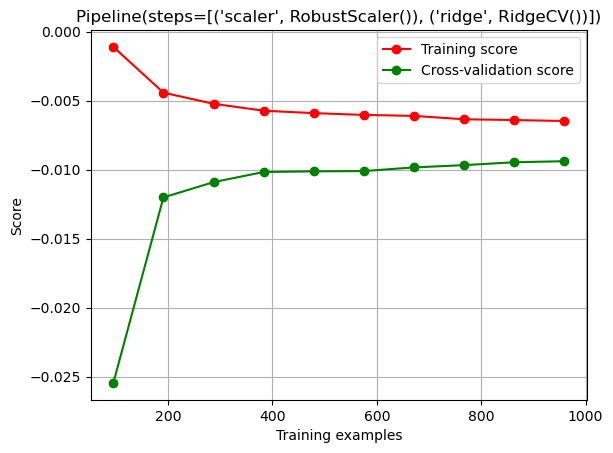

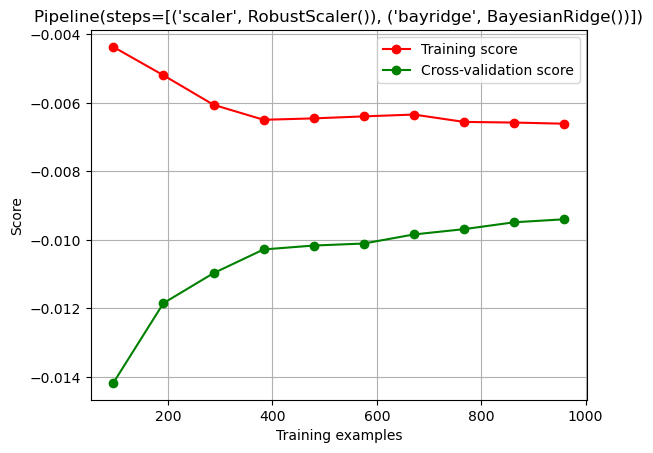

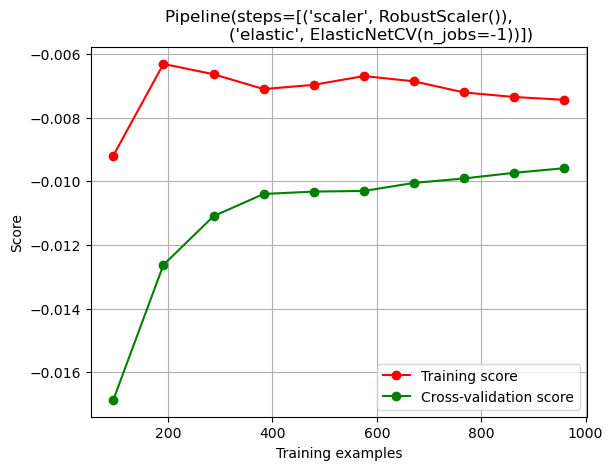

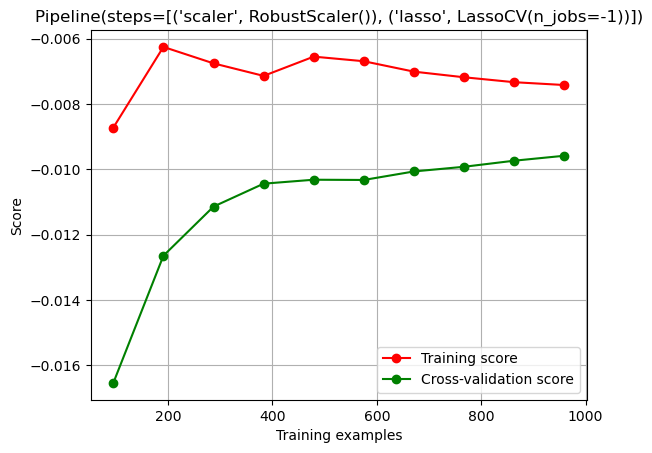

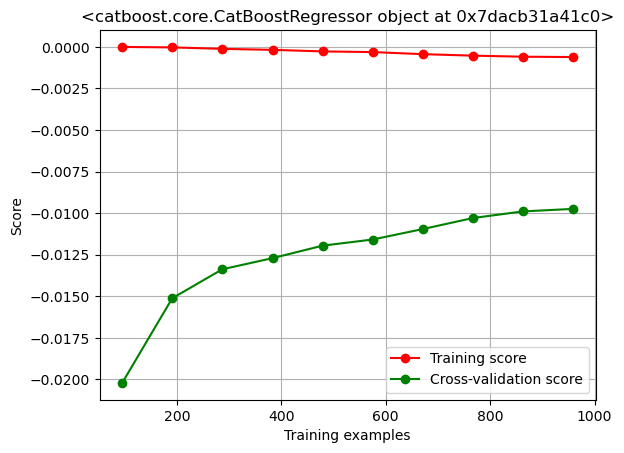

In [87]:
kfold = 3
plot_learning_curve(best_ridge,X_train,y,kfold,np.linspace(0.1,1,10))
plot_learning_curve(best_bayridge,X_train,y,kfold,np.linspace(0.1,1,10))
plot_learning_curve(best_elastic,X_train,y,kfold,np.linspace(0.1,1,10))
plot_learning_curve(best_lasso,X_train,y,kfold,np.linspace(0.1,1,10))
plot_learning_curve(best_cbr,X_train,y,kfold,np.linspace(0.1,1,10))

**All models are showing signs of a good fit, with a converging training and cross-validation score over training examples. The only model showing otherwise, as overfitting, is cbr. However, the training score is converging so the overfitting isn't severe enough to disregard the model**

**Look at feature importances and coefficients for the regularization models. This can give insight into new features we can make alongside the correlations with SalePrice**

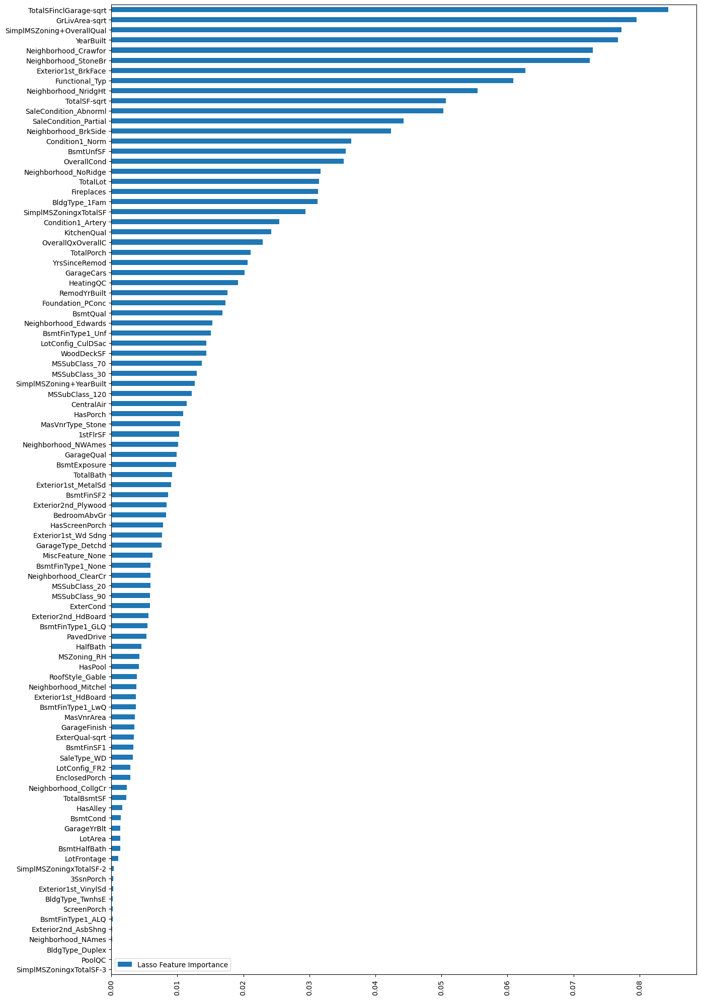

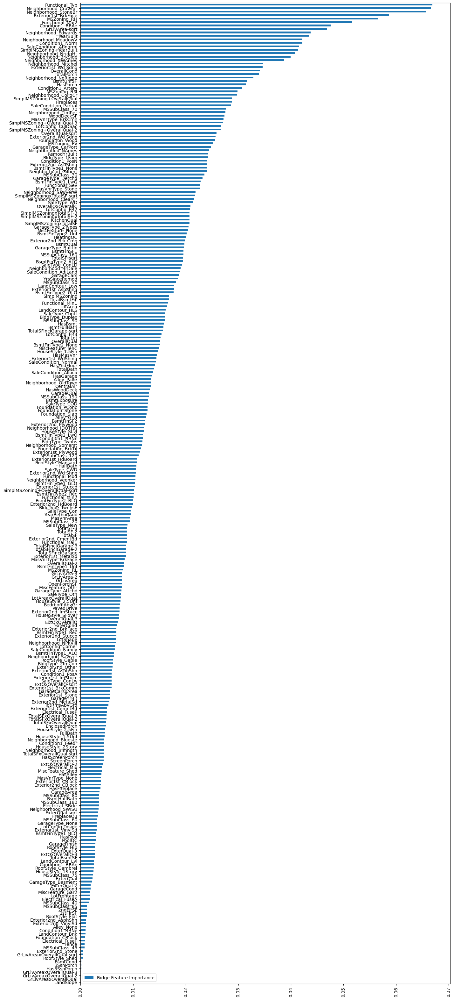

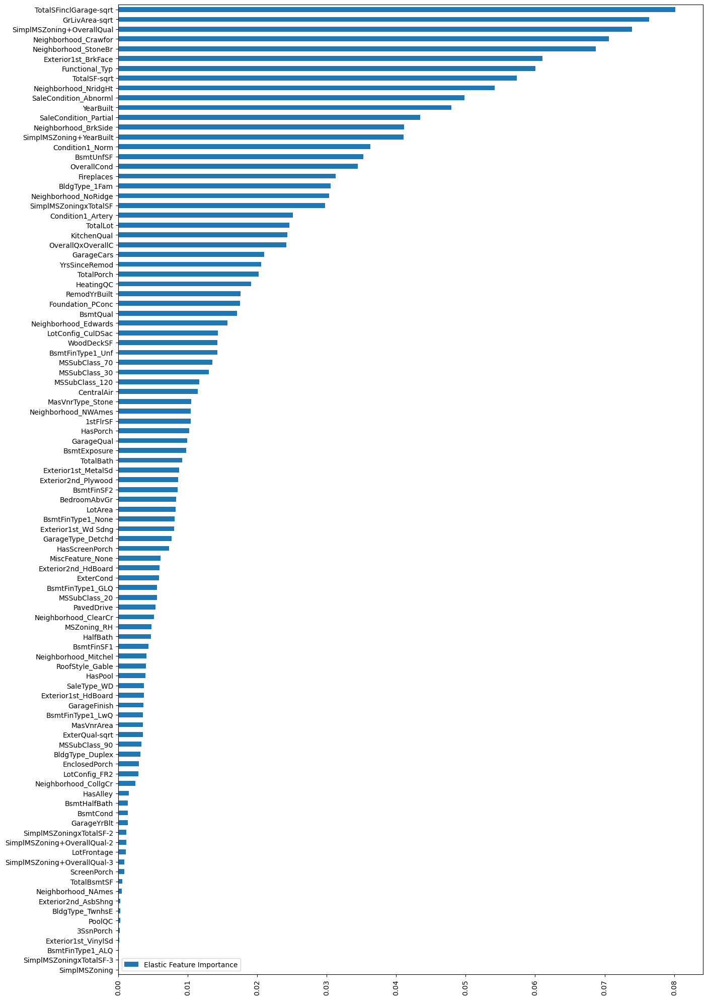

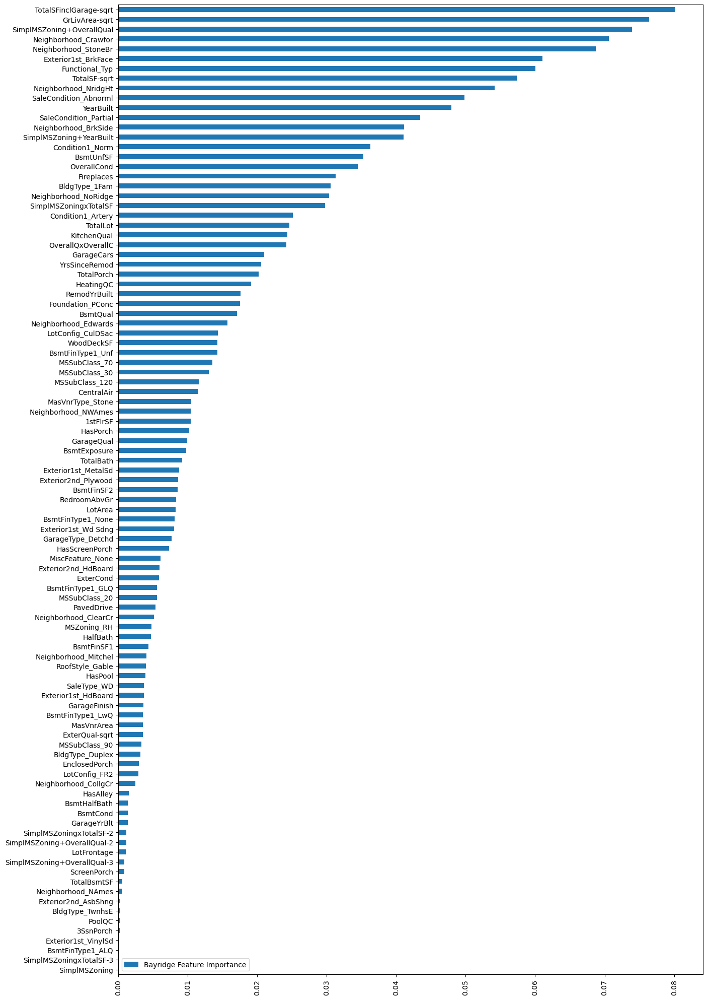

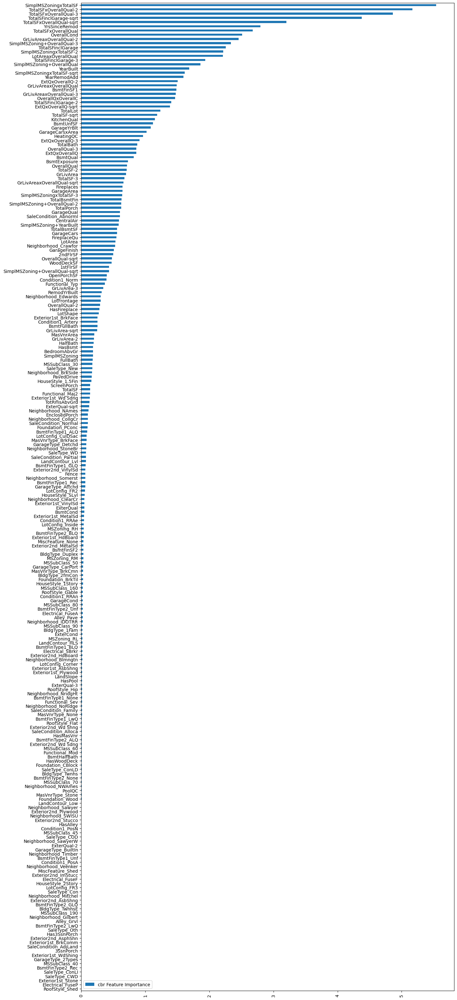

In [88]:
lasso_coeff = pd.DataFrame({'Lasso Feature Importance':abs(best_lasso.steps[1][1].coef_)}, index=X_train.columns)
lasso_coeff[lasso_coeff["Lasso Feature Importance"]!=0].sort_values("Lasso Feature Importance").plot(kind="barh",figsize=(15,25))
plt.xticks(rotation=90)
plt.show()

ridge_coeff = pd.DataFrame({'Ridge Feature Importance':abs(best_ridge.steps[1][1].coef_)}, index=X_train.columns)
ridge_coeff[ridge_coeff["Ridge Feature Importance"]!=0].sort_values("Ridge Feature Importance").plot(kind="barh",figsize=(15,40))
plt.xticks(rotation=90)
plt.show()

elastic_coeff = pd.DataFrame({'Elastic Feature Importance':abs(best_elastic.steps[1][1].coef_)}, index=X_train.columns)
elastic_coeff[elastic_coeff["Elastic Feature Importance"]!=0].sort_values("Elastic Feature Importance").plot(kind="barh",figsize=(15,25))
plt.xticks(rotation=90)
plt.show()

bayridge_coeff = pd.DataFrame({'Bayridge Feature Importance':abs(best_elastic.steps[1][1].coef_)}, index=X_train.columns)
bayridge_coeff[bayridge_coeff["Bayridge Feature Importance"]!=0].sort_values("Bayridge Feature Importance").plot(kind="barh",figsize=(15,25))
plt.xticks(rotation=90)
plt.show()

cbr_fi = pd.DataFrame({'cbr Feature Importance':abs(best_cbr.feature_importances_)}, index=X_train.columns)
cbr_fi[cbr_fi["cbr Feature Importance"]!=0].sort_values("cbr Feature Importance").plot(kind="barh",figsize=(15,40))
plt.xticks(rotation=90)
plt.show()

In [89]:
#gbr_fi = pd.DataFrame({'gbr Feature Importance':abs(best_gbr.feature_importances_)}, index=X_train.columns)
#gbr_fi[gbr_fi["gbr Feature Importance"]!=0].sort_values("gbr Feature Importance").plot(kind="barh",figsize=(15,40))
#plt.xticks(rotation=90)
#plt.show()

#lgbm_fi = pd.DataFrame({'lgbm Feature Importance':abs(best_lgbm.feature_importances_)}, index=X_train.columns)
#lgbm_fi[lgbm_fi["lgbm Feature Importance"]!=0].sort_values("lgbm Feature Importance").plot(kind="barh",figsize=(15,40))
#plt.xticks(rotation=90)
#plt.show()

#xgb_fi = pd.DataFrame({'xgb Feature Importance':abs(best_xgb.feature_importances_)}, index=X_train.columns)
#xgb_fi[xgb_fi["xgb Feature Importance"]!=0].sort_values("xgb Feature Importance").plot(kind="barh",figsize=(15,40))
#plt.xticks(rotation=90)
#plt.show()

**Here I wrote 2 functions, with help from Jack Roberts' notebook to help automate the feature engineering process as there are so many combinations which could be useful to the models. In addition to Jack Roberts'notebook, I included added features. Some of which contributed unexpectedly well to the score such as the SimplMSZoning + OverallQual feature**

In [90]:
def add_features():
    #restrict to non-binary columns and non-zero coeffs
    select_cols = []
    for col in elastic_coeff.index.tolist():
        if(elastic_coeff.loc[col].values != [0]):
            if(X_train[col].nunique()>2):
                select_cols.append(col)
    X_train_add = X_train[select_cols]
    print(select_cols)
    for i in range(len(select_cols)-1):
        for j in range(i+1,len(select_cols)):
            new_col = select_cols[i] + '+' + select_cols[j]
            X_train_add[new_col] = X_train_add[select_cols[i]] + X_train_add[select_cols[j]]
    
    model = best_elastic.fit(X_train_add,y)
    add_coefs = pd.Series(model.steps[1][1].coef_)

    print('------------------------')
    print(sum(add_coefs==0),'zero coefficients')
    print(sum(add_coefs!=0),'non-zero coefficients')
    print('------------------------')
    print('Features with largest coefficients:')
    print('------------------------')
    add_coeff = pd.DataFrame({'Feature Importance':abs(model.steps[1][1].coef_)}, index=X_train_add.columns)
    print(add_coeff[add_coeff["Feature Importance"]!=0].sort_values("Feature Importance",ascending=False))
    print('------------------------')
#add_features()

In [91]:
def poly_features():
    #restrict to non-binary columns and non-zero coeffs
    select_cols = []
    for col in elastic_coeff.index.tolist():
        if(elastic_coeff.loc[col].values != [0]):
            if(X_train[col].nunique()>2):
                select_cols.append(col)
    X_train_selected = X_train[select_cols]
    print(select_cols)
    # add interaction terms (x1*x2, but not x1**2) for all remaining features
    poly = PolynomialFeatures(interaction_only=True)
    X_poly = poly.fit_transform(X_train_selected,y)
    X_poly = pd.DataFrame(X_poly,index=y.index)
    # save info on which features contribute to each term in X_poly
    powers = pd.DataFrame(poly.powers_,columns=X_train_selected.columns)
    s = np.where(powers>0, pd.Series(X_train_selected.columns)+', ', '')
    poly_terms = pd.Series([''.join(x).strip() for x in s])

    model = best_elastic.fit(X_poly,y)
    poly_coefs = pd.Series(model.steps[1][1].coef_)

    print('------------------------')
    print(sum(poly_coefs==0),'zero coefficients')
    print(sum(poly_coefs!=0),'non-zero coefficients')
    print(len(poly_coefs[(powers.sum(axis=1)==2) & (poly_coefs>0)]),'non-zero interaction terms.')
    print('------------------------')
    print('Features with largest coefficients:')
    print('------------------------')
    print(poly_terms[poly_coefs.abs().sort_values(ascending=False).index[:30]])
    print('------------------------')
    best_elastic.fit(X_train,y)

#poly_features()

**Look at correlations of models before deciding on blending. If the results of models are very highly correlated we should consider this in our ensembling to avoid bias.**

<Axes: >

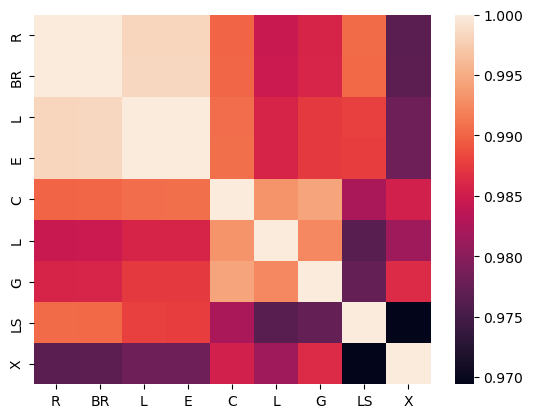

In [92]:
ridge_predictions = pd.Series(best_ridge.predict(X_test), name="R")
bayridge_predictions = pd.Series(best_bayridge.predict(X_test), name="BR")
lasso_predictions = pd.Series(best_lasso.predict(X_test), name="L")
elastic_predictions = pd.Series(best_elastic.predict(X_test), name="E")
cbr_predictions = pd.Series(best_cbr.predict(X_test), name="C")
lgbm_predictions = pd.Series(best_lgbm.predict(X_test), name="L")
gbr_predictions = pd.Series(best_gbr.predict(X_test), name="G")
linsvr_predictions = pd.Series(best_linsvr.predict(X_test), name="LS")
xgb_predictions = pd.Series(best_xgb.predict(X_test), name="X")

# Concatenate all classifier results
model_predictions = pd.concat([ridge_predictions,bayridge_predictions,lasso_predictions,
                               elastic_predictions, cbr_predictions, lgbm_predictions,
                              gbr_predictions,linsvr_predictions,xgb_predictions],axis=1)

sns.heatmap(model_predictions.corr())

**Lets use a StackingRegressor with the same number of cv folds as we have been using. I will use bayridge and lasso but not ridge/elastic as they have very similar results as seen above. With some trial and error I found gbr, lgbm and xgb hindered the results but linsvr didn't so this is the final stackingregressor I came up with.**

In [93]:
kf2 = KFold(10, shuffle=True, random_state=0)

stack = StackingRegressor(
    estimators=[('lasso',best_lasso), #('ridge',best_ridge),
                ('bayridge',bayridge),#('elastic',best_elastic),
                ('cbr',best_cbr), #, ('gbr',best_gbr),('lgbm',best_lgbm)
                ('linsvr',best_linsvr)], # ('xgb',best_xgb)
    cv=kf2, n_jobs=-1,
     final_estimator=best_bayridge)
stack.fit(X_train,y)

#rmse= -cross_val_score(stack, X_train, y, scoring="neg_mean_squared_error",n_jobs=-1)
#print('StackingRegressor Scores')
#print(rmse)
#print(rmse.mean())
#print(rmse.std())

/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.122e-02, tolerance: 2.190e-02
  model = cd_fast.enet_coordinate_descent(
/opt/conda/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.754e-02, tolerance: 1.976e-02
  model = cd_fast.enet_coordinate_descent(
/opt/conda/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not conver

StackingRegressor(cv=KFold(n_splits=10, random_state=0, shuffle=True),
                  estimators=[('lasso',
                               Pipeline(steps=[('scaler', RobustScaler()),
                                               ('lasso', LassoCV(n_jobs=-1))])),
                              ('bayridge',
                               Pipeline(steps=[('scaler', RobustScaler()),
                                               ('bayridge', BayesianRidge())])),
                              ('cbr',
                               <catboost.core.CatBoostRegressor object at 0x7dacb31a41c0>),
                              ('linsvr',
                               Pipeline(steps=[('scaler', RobustScaler()),
                                               ('svr',
                                                LinearSVR(random_state=0))]))],
                  final_estimator=Pipeline(steps=[('scaler', RobustScaler()),
                                                  ('bayridge',
                                                   BayesianRidge())]),
                  n_jobs=-1)

In [94]:
#plot_learning_curve(stack,X_train,y,3,np.linspace(0.1,1,5))
#This is very slow even with the quickest parameters so I will hashtag this out

**Try to use blending to improve the result, this helps with any outliers produced by the stackingregressor. I decided to only use the stackingregressor in the end as this gave the best LB score by itself**

In [95]:
def blended_model(a,b,c,d,e,f,g,h,i,j):
    return ((a*best_ridge.predict(X_test))+(b*best_lasso.predict(X_test))+
            (c*best_elastic.predict(X_test))+(d*best_bayridge.predict(X_test)) + 
            (e*best_cbr.predict(X_test)) + (f*best_gbr.predict(X_test)) + 
            (g*best_linsvr.predict(X_test)) + (h*best_lgbm.predict(X_test)) +
            (i*best_xgb.predict(X_test)) + (j*stack.predict(X_test)))

**Choose Final Model and Fit**

In [96]:
predictions = blended_model(0,0,0,0,0,0,0,0,0,1) 
print(np.exp(predictions))

[119850.56931575 163664.29754011 187523.4555003  ... 171084.11170309
 116054.6677661  224192.56351234]


# 8) Submission

In [97]:
submission = pd.DataFrame({'Id': test.index,
                           'SalePrice': np.exp(predictions)})            #Must not forget to apply inverse of logarithm
submission.to_csv("../../kaggle/working/Imputed.csv", index=False)

# 9) Notes

**I changed the parameters of linsvr and gbr to include a random_state as I realised that the cross validation scores provided for these models were inconsistent. I should have realised this a long time ago. I also realised that the OverallQual*OverallCond feature had a typo and have fixed this now too**

**More notes at top for viewers**